In [1]:
# To reload local package without restarting kernel every time
%load_ext autoreload
%autoreload 1
%aimport climTools.helperFunctions

# Basic libraries
import numpy as np
import pandas as pd
import xarray as xr
import xskillscore as xs
import dask.array as da

# My local package
from climTools.helperFunctions import *


# Plotting libraries
import matplotlib.pyplot as plt
import cartopy.crs as ccrs

# matplotlib ipympl
%config InlineBackend.figure_format="png"

ERROR 1: PROJ: proj_create_from_database: Open of /net/nfs/tools/u20/Python/miniconda3_py311_23.11.0-2/envs/pangeo-meso-2024.01.22/share/proj failed


# Import data

In [2]:
# Load IPSL-CM6A-LR data

tas_path_ipsl = "/homedata/pchevali/clean_data_ipsl/preprocessed/tas_day_IPSL-CM6A-LR_historical_allruns_19500101-20141231_30W_40E_30N_75N.nc"
tas_anom_path_ipsl = "/homedata/pchevali/clean_data_ipsl/preprocessed/tas_anom_day_IPSL-CM6A-LR_historical_allruns_19500101-20141231_30W_40E_30N_75N.nc"
tas_ipsl = xr.open_dataset(tas_path_ipsl)
tas_anom_ipsl = xr.open_dataset(tas_anom_path_ipsl)

zg_path_ipsl = "/homedata/pchevali/clean_data_ipsl/preprocessed/zg_day_IPSL-CM6A-LR_historical_allruns_19500101-20141231_30W_40E_30N_75N.nc"
zg_anom_path_ipsl = "/homedata/pchevali/clean_data_ipsl/preprocessed/zg_anom_day_IPSL-CM6A-LR_historical_allruns_19500101-20141231_30W_40E_30N_75N.nc"
zg_ipsl = xr.open_dataset(zg_path_ipsl)
zg_anom_ipsl = xr.open_dataset(zg_anom_path_ipsl)

psl_path_ipsl = "/homedata/pchevali/clean_data_ipsl/preprocessed/psl_day_IPSL-CM6A-LR_historical_allruns_19500101-20141231_30W_40E_30N_75N.nc"
psl_anom_path_ipsl = "/homedata/pchevali/clean_data_ipsl/preprocessed/psl_anom_day_IPSL-CM6A-LR_historical_allruns_19500101-20141231_30W_40E_30N_75N.nc"
psl_ipsl = xr.open_dataset(psl_path_ipsl)
psl_anom_ipsl = xr.open_dataset(psl_anom_path_ipsl)

pr10_path_ipsl = "/homedata/pchevali/clean_data_ipsl/preprocessed/pr10_day_IPSL-CM6A-LR_historical_allruns_19500101-20141231_30W_40E_30N_75N.nc"
pr10_anom_path_ipsl = "/homedata/pchevali/clean_data_ipsl/preprocessed/pr10_anom_day_IPSL-CM6A-LR_historical_allruns_19500101-20141231_30W_40E_30N_75N.nc"
pr10_ipsl = xr.open_dataset(pr10_path_ipsl)
pr10_anom_ipsl = xr.open_dataset(pr10_anom_path_ipsl)

# Load ERA5 data

tas_path_era5 = "/homedata/pchevali/ERA5/preprocessed/era5_tas_daily_eu.nc"
tas_anom_path_era5 = "/homedata/pchevali/ERA5/preprocessed/era5_tas_anom_daily_eu.nc"
tas_era5 = xr.open_dataset(tas_path_era5)
tas_anom_era5 = xr.open_dataset(tas_anom_path_era5)

zg_path_era5 = "/homedata/pchevali/ERA5/preprocessed/era5_zg_daily_eu.nc"
zg_anom_path_era5 = "/homedata/pchevali/ERA5/preprocessed/era5_zg_anom_daily_eu.nc"
zg_era5 = xr.open_dataset(zg_path_era5)
zg_anom_era5 = xr.open_dataset(zg_anom_path_era5)

psl_path_era5 = "/homedata/pchevali/ERA5/preprocessed/era5_psl_daily_eu.nc"
psl_anom_path_era5 = "/homedata/pchevali/ERA5/preprocessed/era5_psl_anom_daily_eu.nc"
psl_era5 = xr.open_dataset(psl_path_era5)
psl_anom_era5 = xr.open_dataset(psl_anom_path_era5)

pr10_path_era5 = "/homedata/pchevali/ERA5/preprocessed/era5_pr10_daily_eu.nc"
pr10_anom_path_era5 = "/homedata/pchevali/ERA5/preprocessed/era5_pr10_anom_daily_eu.nc"
pr10_era5 = xr.open_dataset(pr10_path_era5)
pr10_anom_era5 = xr.open_dataset(pr10_anom_path_era5)

tas_era5 = tas_era5.interp(lat=tas_ipsl.lat, lon=tas_ipsl.lon)
tas_anom_era5 = tas_anom_era5.interp(lat=tas_ipsl.lat, lon=tas_ipsl.lon)
zg_era5 = zg_era5.interp(lat=tas_ipsl.lat, lon=tas_ipsl.lon)
zg_anom_era5 = zg_anom_era5.interp(lat=tas_ipsl.lat, lon=tas_ipsl.lon)
psl_era5 = psl_era5.interp(lat=tas_ipsl.lat, lon=tas_ipsl.lon)
psl_anom_era5 = psl_anom_era5.interp(lat=tas_ipsl.lat, lon=tas_ipsl.lon)
pr10_era5 = pr10_era5.interp(lat=tas_ipsl.lat, lon=tas_ipsl.lon)
pr10_anom_era5 = pr10_anom_era5.interp(lat=tas_ipsl.lat, lon=tas_ipsl.lon)

# Merge data

zg_anom_merged = xr.concat([zg_anom_era5, zg_anom_ipsl], dim="time")
psl_anom_merged = xr.concat([psl_anom_era5, psl_anom_ipsl], dim="time")
pr10_anom_merged = xr.concat([pr10_anom_era5, pr10_anom_ipsl], dim="time")
tas_anom_merged = xr.concat([tas_anom_era5, tas_anom_ipsl], dim="time")

# Import analogs

In [3]:
analogs_zg_era5_to_era5 = xr.open_dataset(
    "/homedata/pchevali/analogs/analogs_zg_era5_to_era5.nc"
)
analogs_psl_era5_to_era5 = xr.open_dataset(
    "/homedata/pchevali/analogs/analogs_psl_era5_to_era5.nc"
)
analogs_zg_era5_to_all = xr.open_dataset(
    "/homedata/pchevali/analogs/analogs_zg_era5_to_all.nc"
)
analogs_psl_era5_to_all = xr.open_dataset(
    "/homedata/pchevali/analogs/analogs_psl_era5_to_all.nc"
)
analogs_weighted_era5_to_era5 = xr.open_dataset(
    "/homedata/pchevali/analogs/analogs_weighted_era5_to_era5_w22.nc"
)
analogs_weighted_era5_to_all = xr.open_dataset(
    "/homedata/pchevali/analogs/analogs_weighted_era5_to_all_w22.nc"
)
analogs_weighted_with_tas_era5_to_era5 = xr.open_dataset(
    "/homedata/pchevali/analogs/analogs_weighted_with_tas_era5_to_era5.nc"
)
analogs_weighted_with_tas_era5_to_all = xr.open_dataset(
    "/homedata/pchevali/analogs/analogs_weighted_with_tas_era5_to_all.nc"
)
analogs_weighted_with_tas_era5_to_era5_ranked = xr.open_dataset(
    "/homedata/pchevali/analogs/analogs_weighted_with_tas_era5_to_era5_ranked.nc"
)
analogs_weighted_with_tas_era5_to_all_ranked = xr.open_dataset(
    "/homedata/pchevali/analogs/analogs_weighted_with_tas_era5_to_all_ranked.nc"
)

# Plots of analogs at lag0

## zg era5

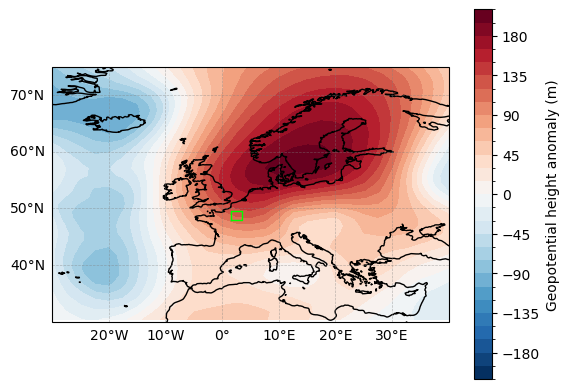

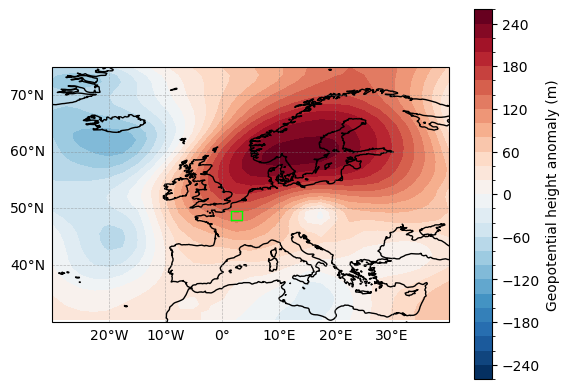

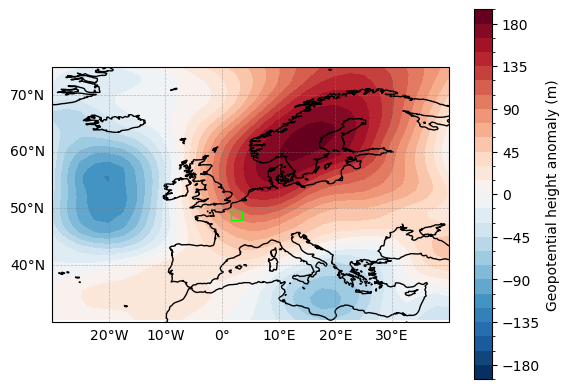

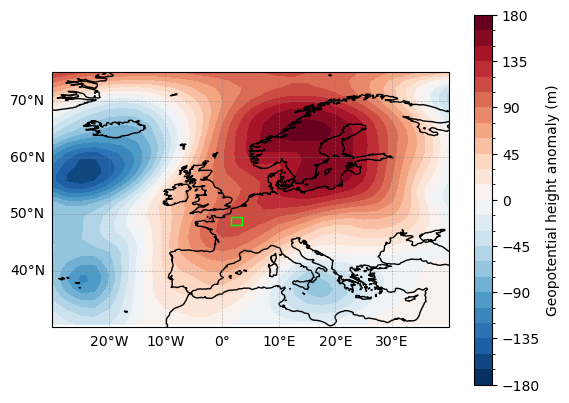

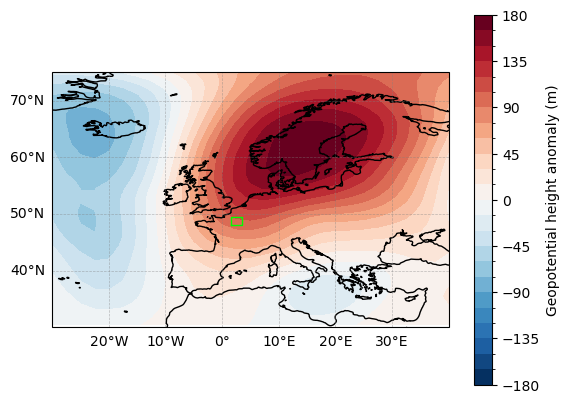

In [4]:
d = np.random.choice(analogs_zg_era5_to_era5.time.values)
analogs = analogs_zg_era5_to_era5.sel(time=d).analog_date.values
plot_one_date(
    field1=zg_anom_era5.zg,
    cmap_legend="Geopotential height anomaly (m)",
    lat_min=30,
    lat_max=75,
    lon_min=-30,
    lon_max=40,
    time=d,
)
plot_one_date(
    field1=zg_anom_era5.zg,
    cmap_legend="Geopotential height anomaly (m)",
    lat_min=30,
    lat_max=75,
    lon_min=-30,
    lon_max=40,
    time=analogs[0],
)
plot_one_date(
    field1=zg_anom_era5.zg,
    cmap_legend="Geopotential height anomaly (m)",
    lat_min=30,
    lat_max=75,
    lon_min=-30,
    lon_max=40,
    time=analogs[1],
)
plot_one_date(
    field1=zg_anom_era5.zg,
    cmap_legend="Geopotential height anomaly (m)",
    lat_min=30,
    lat_max=75,
    lon_min=-30,
    lon_max=40,
    time=analogs[2],
)
plot_composite(
    field1=zg_anom_era5.zg,
    cmap_legend="Geopotential height anomaly (m)",
    lat_min=30,
    lat_max=75,
    lon_min=-30,
    lon_max=40,
    times=analogs,
)

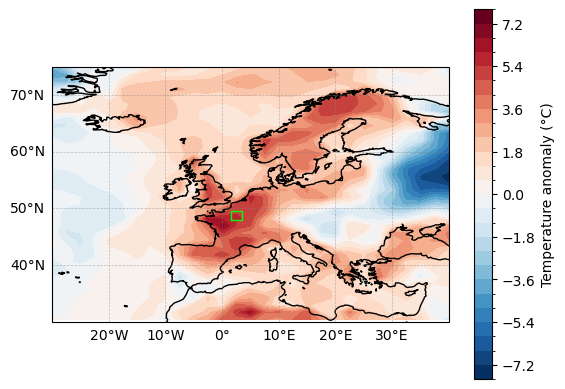

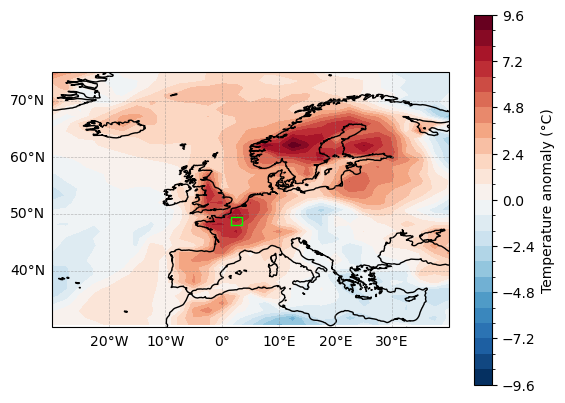

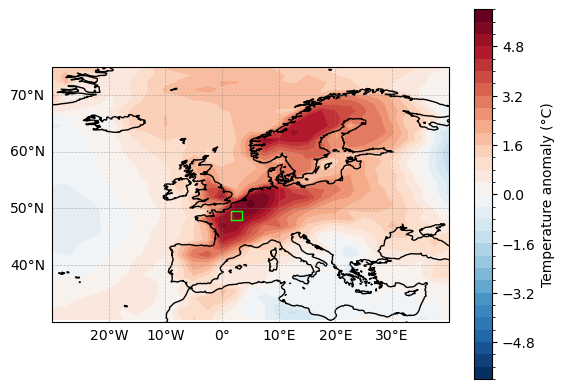

In [5]:
plot_one_date(
    field1=tas_anom_era5.tas,
    cmap_legend="Temperature anomaly (°C)",
    lat_min=30,
    lat_max=75,
    lon_min=-30,
    lon_max=40,
    time=d,
)
plot_one_date(
    field1=tas_anom_era5.tas,
    cmap_legend="Temperature anomaly (°C)",
    lat_min=30,
    lat_max=75,
    lon_min=-30,
    lon_max=40,
    time=analogs[0],
)
plot_composite(
    field1=tas_anom_era5.tas,
    cmap_legend="Temperature anomaly (°C)",
    lat_min=30,
    lat_max=75,
    lon_min=-30,
    lon_max=40,
    times=analogs,
)

## psl era5

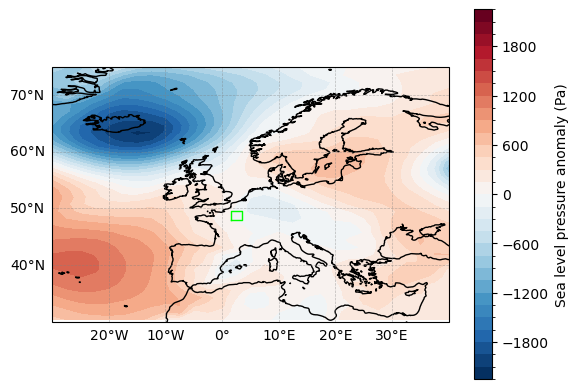

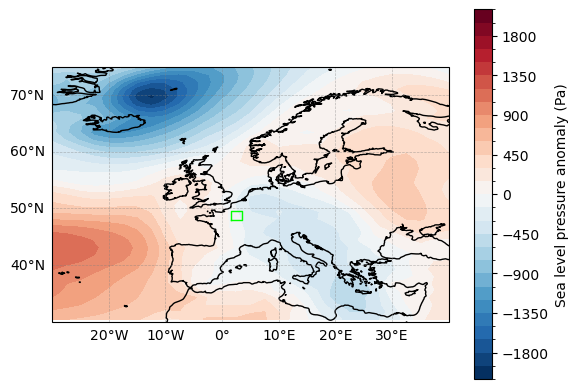

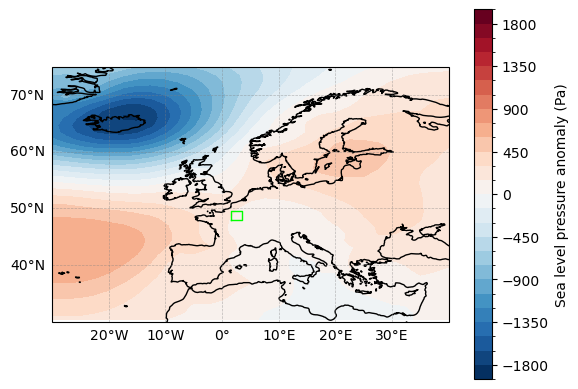

In [6]:
d = np.random.choice(analogs_zg_era5_to_era5.time.values)
analogs = analogs_psl_era5_to_era5.sel(time=d).analog_date.values
plot_one_date(
    field1=psl_anom_era5.psl,
    cmap_legend="Sea level pressure anomaly (Pa)",
    lat_min=30,
    lat_max=75,
    lon_min=-30,
    lon_max=40,
    time=d,
)
plot_one_date(
    field1=psl_anom_era5.psl,
    cmap_legend="Sea level pressure anomaly (Pa)",
    lat_min=30,
    lat_max=75,
    lon_min=-30,
    lon_max=40,
    time=analogs[0],
)
plot_composite(
    field1=psl_anom_era5.psl,
    cmap_legend="Sea level pressure anomaly (Pa)",
    lat_min=30,
    lat_max=75,
    lon_min=-30,
    lon_max=40,
    times=analogs,
)

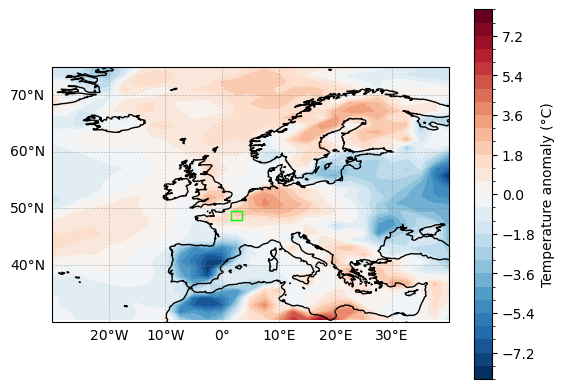

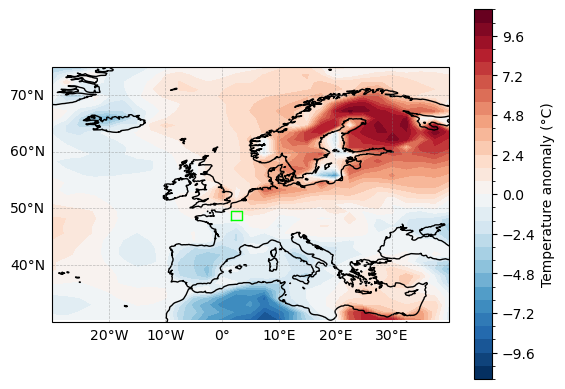

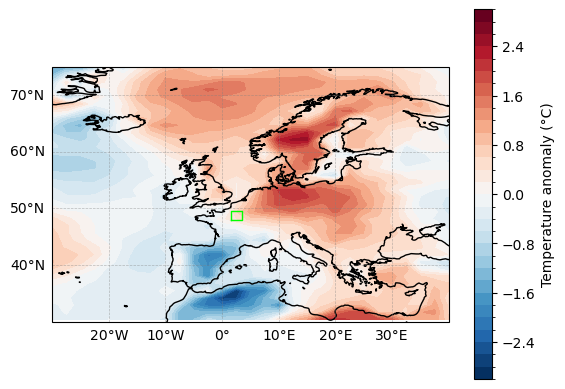

In [7]:
plot_one_date(
    field1=tas_anom_era5.tas,
    cmap_legend="Temperature anomaly (°C)",
    lat_min=30,
    lat_max=75,
    lon_min=-30,
    lon_max=40,
    time=d,
)
plot_one_date(
    field1=tas_anom_era5.tas,
    cmap_legend="Temperature anomaly (°C)",
    lat_min=30,
    lat_max=75,
    lon_min=-30,
    lon_max=40,
    time=analogs[0],
)
plot_composite(
    field1=tas_anom_era5.tas,
    cmap_legend="Temperature anomaly (°C)",
    lat_min=30,
    lat_max=75,
    lon_min=-30,
    lon_max=40,
    times=analogs,
)

## zg era5 ipsl

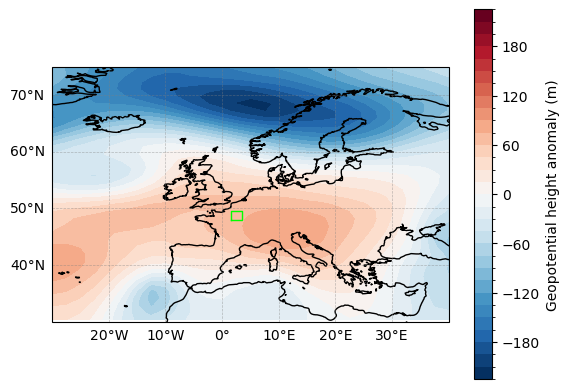

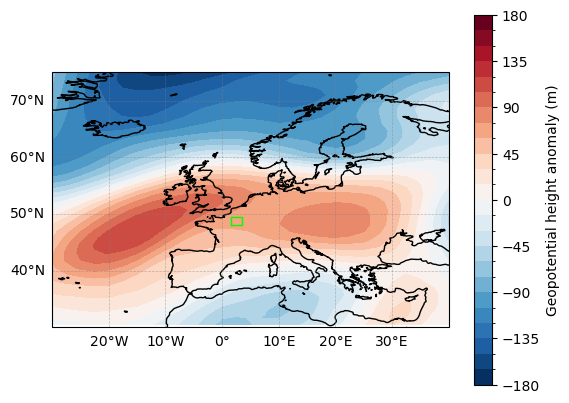

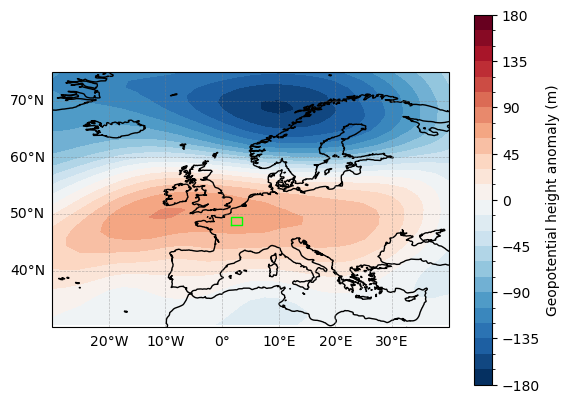

In [8]:
d = np.random.choice(analogs_zg_era5_to_all.time.values)
analogs = analogs_zg_era5_to_all.sel(time=d).analog_date.values
plot_one_date(
    field1=zg_anom_merged.zg,
    cmap_legend="Geopotential height anomaly (m)",
    lat_min=30,
    lat_max=75,
    lon_min=-30,
    lon_max=40,
    time=d,
)
plot_one_date(
    field1=zg_anom_merged.zg,
    cmap_legend="Geopotential height anomaly (m)",
    lat_min=30,
    lat_max=75,
    lon_min=-30,
    lon_max=40,
    time=analogs[0],
)
plot_composite(
    field1=zg_anom_merged.zg,
    cmap_legend="Geopotential height anomaly (m)",
    lat_min=30,
    lat_max=75,
    lon_min=-30,
    lon_max=40,
    times=analogs,
)

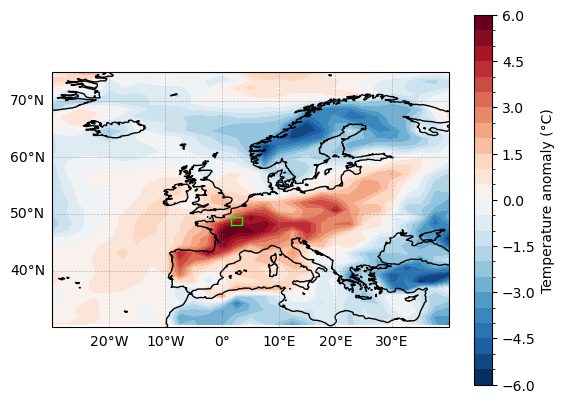

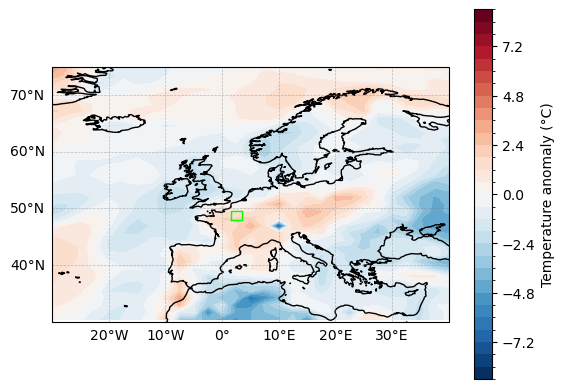

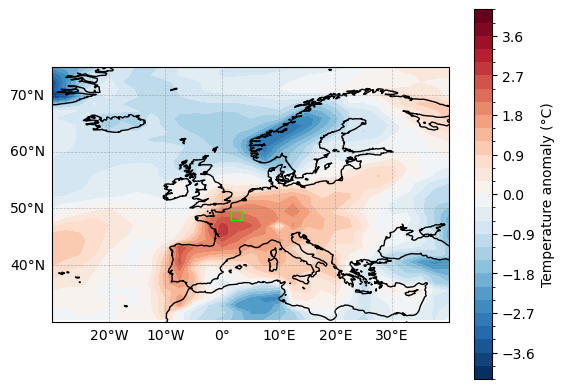

In [9]:
plot_one_date(
    field1=tas_anom_merged.tas,
    cmap_legend="Temperature anomaly (°C)",
    lat_min=30,
    lat_max=75,
    lon_min=-30,
    lon_max=40,
    time=d,
)
plot_one_date(
    field1=tas_anom_merged.tas,
    cmap_legend="Temperature anomaly (°C)",
    lat_min=30,
    lat_max=75,
    lon_min=-30,
    lon_max=40,
    time=analogs[0],
)
plot_composite(
    field1=tas_anom_merged.tas,
    cmap_legend="Temperature anomaly (°C)",
    lat_min=30,
    lat_max=75,
    lon_min=-30,
    lon_max=40,
    times=analogs,
)

## psl era5 ipsl

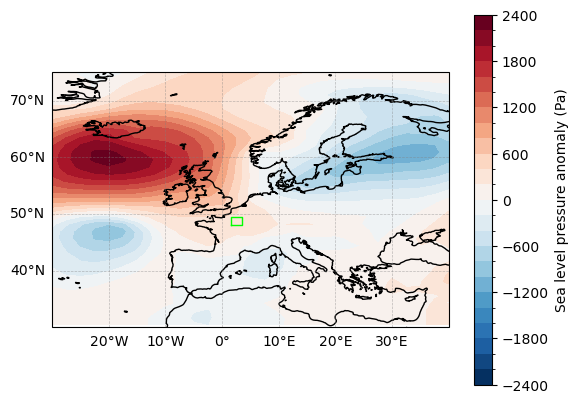

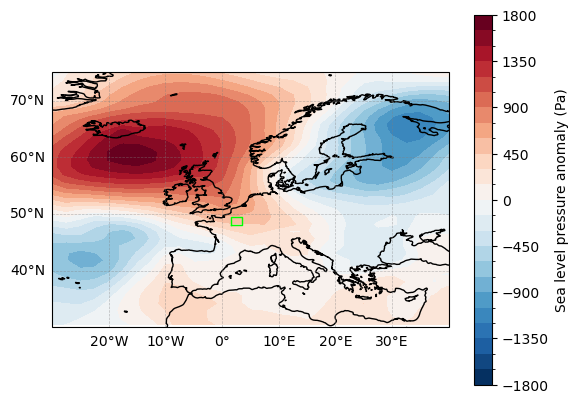

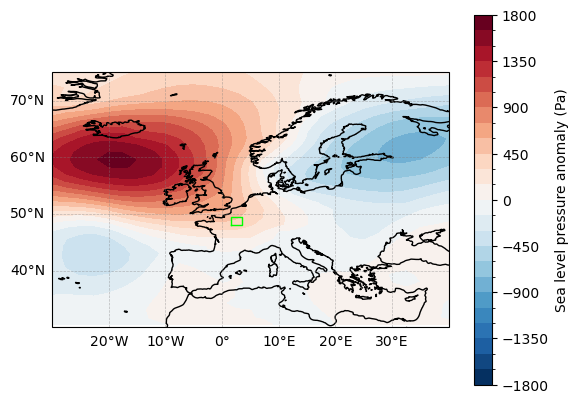

In [10]:
d = np.random.choice(analogs_zg_era5_to_all.time.values)
analogs = analogs_psl_era5_to_all.sel(time=d).analog_date.values
plot_one_date(
    field1=psl_anom_merged.psl,
    cmap_legend="Sea level pressure anomaly (Pa)",
    lat_min=30,
    lat_max=75,
    lon_min=-30,
    lon_max=40,
    time=d,
)
plot_one_date(
    field1=psl_anom_merged.psl,
    cmap_legend="Sea level pressure anomaly (Pa)",
    lat_min=30,
    lat_max=75,
    lon_min=-30,
    lon_max=40,
    time=analogs[0],
)
plot_composite(
    field1=psl_anom_merged.psl,
    cmap_legend="Sea level pressure anomaly (Pa)",
    lat_min=30,
    lat_max=75,
    lon_min=-30,
    lon_max=40,
    times=analogs,
)

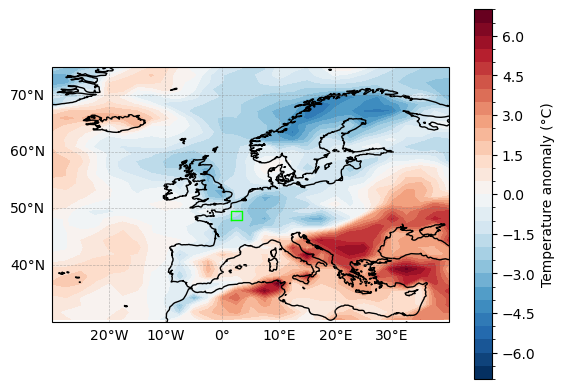

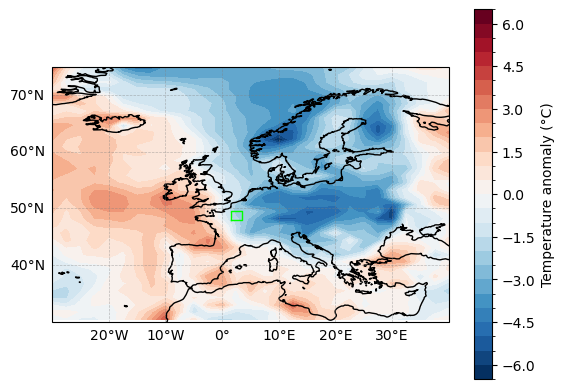

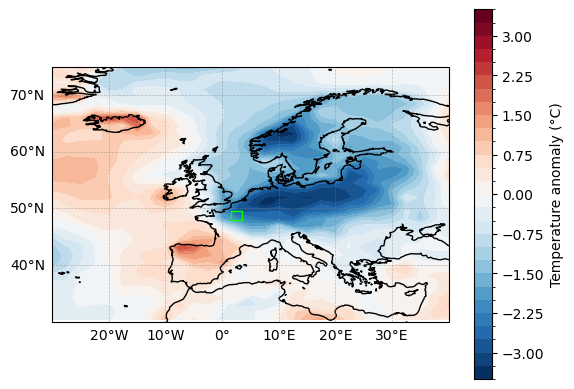

In [11]:
plot_one_date(
    field1=tas_anom_merged.tas,
    cmap_legend="Temperature anomaly (°C)",
    lat_min=30,
    lat_max=75,
    lon_min=-30,
    lon_max=40,
    time=d,
)
plot_one_date(
    field1=tas_anom_merged.tas,
    cmap_legend="Temperature anomaly (°C)",
    lat_min=30,
    lat_max=75,
    lon_min=-30,
    lon_max=40,
    time=analogs[0],
)
plot_composite(
    field1=tas_anom_merged.tas,
    cmap_legend="Temperature anomaly (°C)",
    lat_min=30,
    lat_max=75,
    lon_min=-30,
    lon_max=40,
    times=analogs,
)

## weighted era5

In [12]:
d = np.random.choice(analogs_weighted_era5_to_era5.time.values)
analogs = analogs_weighted_era5_to_era5.sel(time=d).analog_date.values

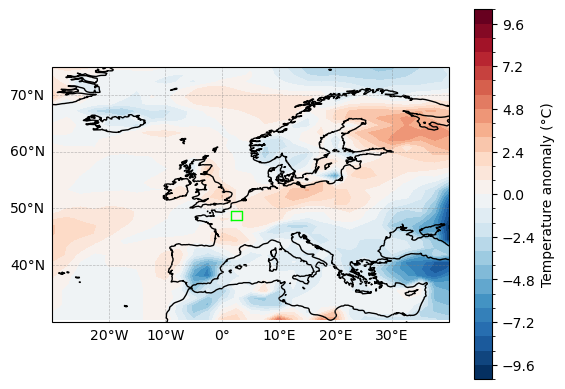

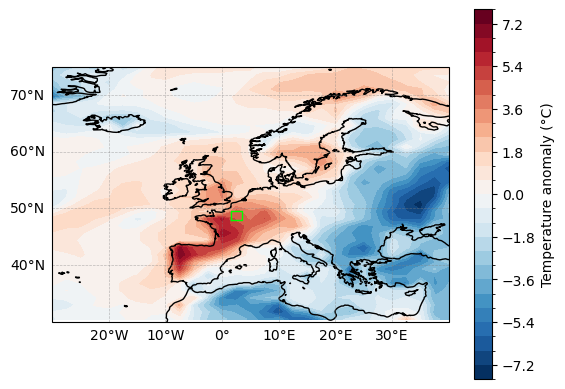

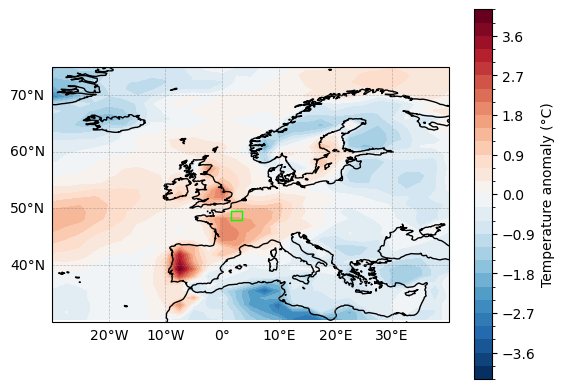

In [13]:
plot_one_date(
    field1=tas_anom_merged.tas,
    cmap_legend="Temperature anomaly (°C)",
    lat_min=30,
    lat_max=75,
    lon_min=-30,
    lon_max=40,
    time=d,
)
plot_one_date(
    field1=tas_anom_merged.tas,
    cmap_legend="Temperature anomaly (°C)",
    lat_min=30,
    lat_max=75,
    lon_min=-30,
    lon_max=40,
    time=analogs[0],
)
plot_composite(
    field1=tas_anom_merged.tas,
    cmap_legend="Temperature anomaly (°C)",
    lat_min=30,
    lat_max=75,
    lon_min=-30,
    lon_max=40,
    times=analogs,
)

## weighted era5 ipsl

In [14]:
analogs = analogs_weighted_era5_to_all.sel(time=d).analog_date.values

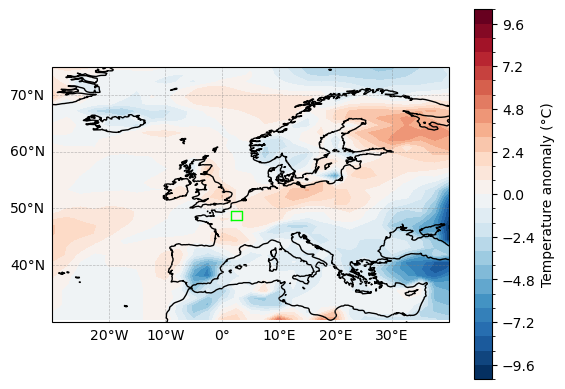

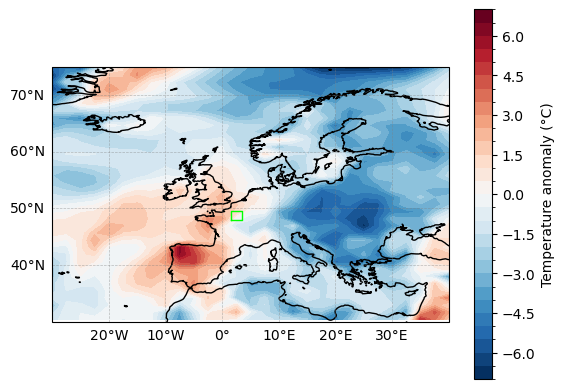

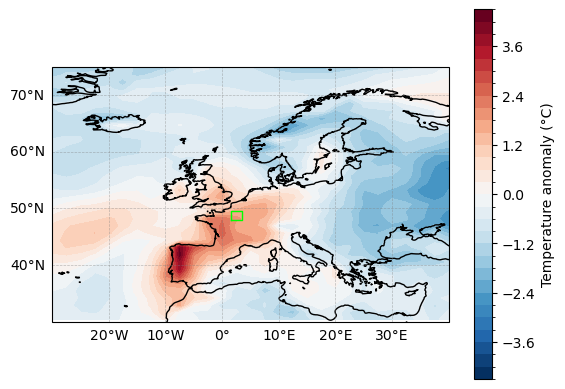

In [15]:
plot_one_date(
    field1=tas_anom_merged.tas,
    cmap_legend="Temperature anomaly (°C)",
    lat_min=30,
    lat_max=75,
    lon_min=-30,
    lon_max=40,
    time=d,
)
plot_one_date(
    field1=tas_anom_merged.tas,
    cmap_legend="Temperature anomaly (°C)",
    lat_min=30,
    lat_max=75,
    lon_min=-30,
    lon_max=40,
    time=analogs[0],
)
plot_composite(
    field1=tas_anom_merged.tas,
    cmap_legend="Temperature anomaly (°C)",
    lat_min=30,
    lat_max=75,
    lon_min=-30,
    lon_max=40,
    times=analogs,
)

# Plots of UNET loss

In [16]:
history_psl_to_tas_ipsl_lag0 = np.load(
    "/homedata/pchevali/model_preds/psl_to_tas_ipsl_lag0.npy", allow_pickle=True
).item()
history_zg_to_tas_ipsl_lag0 = np.load(
    "/homedata/pchevali/model_preds/zg_to_tas_ipsl_lag0.npy", allow_pickle=True
).item()
history_psl_zg_to_tas_ipsl_lag0 = np.load(
    "/homedata/pchevali/model_preds/psl_zg_to_tas_ipsl_lag0.npy", allow_pickle=True
).item()
history_psl_zg_pr10_to_tas_ipsl_lag0 = np.load(
    "/homedata/pchevali/model_preds/psl_zg_pr10_to_tas_ipsl_lag0.npy", allow_pickle=True
).item()

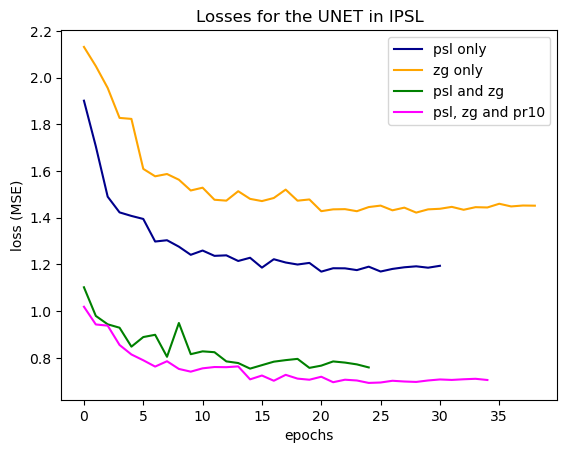

In [17]:
plt.plot(history_psl_to_tas_ipsl_lag0["val_loss"], label="psl only", color="darkblue")
plt.plot(history_zg_to_tas_ipsl_lag0["val_loss"], label="zg only", color="orange")
plt.plot(history_psl_zg_to_tas_ipsl_lag0["val_loss"], label="psl and zg", color="green")
plt.plot(
    history_psl_zg_pr10_to_tas_ipsl_lag0["val_loss"],
    label="psl, zg and pr10",
    color="magenta",
)
plt.ylabel("loss (MSE)")
plt.xlabel("epochs")
plt.title("Losses for the UNET in IPSL")
plt.legend()
plt.show()

There is an increase in performance for the more complete model even though the number of parameters did not change. In spite of this we'll use all the predictors for the other models.

Some hyperparameters such as the model depth and base_filters amount have not been optimised and set at common values, some performance could be gained from hyperparameter tuning.

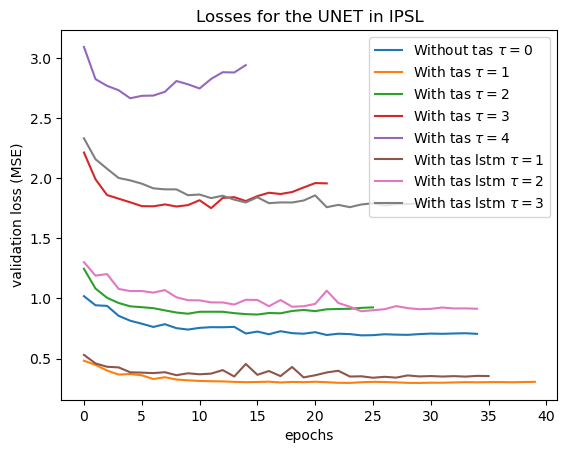

In [18]:
history_psl_zg_pr10_to_tas_ipsl_lag0 = np.load(
    "/homedata/pchevali/model_preds/psl_zg_pr10_to_tas_ipsl_lag0.npy", allow_pickle=True
).item()
history_psl_zg_pr10_to_tas_ipsl_lag1 = np.load(
    "/homedata/pchevali/model_preds/psl_zg_pr10_to_tas_ipsl_lag1.npy", allow_pickle=True
).item()
history_psl_zg_pr10_to_tas_ipsl_lag2 = np.load(
    "/homedata/pchevali/model_preds/psl_zg_pr10_to_tas_ipsl_lag2.npy", allow_pickle=True
).item()
history_psl_zg_pr10_to_tas_ipsl_lag3 = np.load(
    "/homedata/pchevali/model_preds/psl_zg_pr10_to_tas_ipsl_lag3.npy", allow_pickle=True
).item()
history_psl_zg_pr10_to_tas_ipsl_lag4 = np.load(
    "/homedata/pchevali/model_preds/psl_zg_pr10_to_tas_ipsl_lag4.npy", allow_pickle=True
).item()
history_psl_zg_pr10_tas_to_tas_ipsl_lag1 = np.load(
    "/homedata/pchevali/model_preds/psl_zg_pr10_tas_to_tas_ipsl_lag1.npy", allow_pickle=True
).item()
history_psl_zg_pr10_tas_to_tas_ipsl_lag2 = np.load(
    "/homedata/pchevali/model_preds/psl_zg_pr10_tas_to_tas_ipsl_lag2.npy", allow_pickle=True
).item()
history_psl_zg_pr10_tas_to_tas_ipsl_lag3 = np.load(
    "/homedata/pchevali/model_preds/psl_zg_pr10_tas_to_tas_ipsl_lag3.npy", allow_pickle=True
).item()
history_psl_zg_pr10_tas_to_tas_ipsl_lag4 = np.load(
    "/homedata/pchevali/model_preds/psl_zg_pr10_tas_to_tas_ipsl_lag4.npy", allow_pickle=True
).item()
plt.title("Losses for the UNET in IPSL")
history_psl_zg_pr10_tas_to_tas_ipsl_lag1_COMMITTOR = np.load(
    "/homedata/pchevali/model_preds/psl_zg_pr10_tas_to_tas_ipsl_lag1_COMMITTOR.npy", allow_pickle=True
).item()
history_psl_zg_pr10_tas_to_tas_ipsl_lag1_lstm = np.load(
    "/homedata/pchevali/model_preds/psl_zg_pr10_tas_to_tas_ipsl_lag1_lstm.npy", allow_pickle=True
).item()
history_psl_zg_pr10_tas_to_tas_ipsl_lag2_lstm = np.load(
    "/homedata/pchevali/model_preds/psl_zg_pr10_tas_to_tas_ipsl_lag2_lstm.npy", allow_pickle=True
).item()
history_psl_zg_pr10_tas_to_tas_ipsl_lag3_lstm = np.load(
    "/homedata/pchevali/model_preds/psl_zg_pr10_tas_to_tas_ipsl_lag3_lstm.npy", allow_pickle=True
).item()

plt.plot(history_psl_zg_pr10_to_tas_ipsl_lag0["val_loss"], label=r"Without tas $\tau =0$")
# plt.plot(history_psl_zg_pr10_to_tas_ipsl_lag1["val_loss"], label=r"M1$\tau =1$")
# plt.plot(history_psl_zg_pr10_to_tas_ipsl_lag2["val_loss"], label=r"M1$\tau =2$")
# plt.plot(history_psl_zg_pr10_to_tas_ipsl_lag3["val_loss"], label=r"M1$\tau =3$")
# plt.plot(history_psl_zg_pr10_to_tas_ipsl_lag4["val_loss"], label=r"M1$\tau =4$")
plt.plot(history_psl_zg_pr10_tas_to_tas_ipsl_lag1["val_loss"], label=r"With tas $\tau =1$")
plt.plot(history_psl_zg_pr10_tas_to_tas_ipsl_lag2["val_loss"], label=r"With tas $\tau =2$")
plt.plot(history_psl_zg_pr10_tas_to_tas_ipsl_lag3["val_loss"], label=r"With tas $\tau =3$")
plt.plot(history_psl_zg_pr10_tas_to_tas_ipsl_lag4["val_loss"], label=r"With tas $\tau =4$")
plt.plot(history_psl_zg_pr10_tas_to_tas_ipsl_lag1_lstm["val_loss"], label=r"With tas lstm $\tau =1$")
plt.plot(history_psl_zg_pr10_tas_to_tas_ipsl_lag2_lstm["val_loss"], label=r"With tas lstm $\tau =2$")
plt.plot(history_psl_zg_pr10_tas_to_tas_ipsl_lag3_lstm["val_loss"], label=r"With tas lstm $\tau =3$")
plt.ylabel("validation loss (MSE)")
plt.xlabel("epochs")
plt.legend()
plt.show()

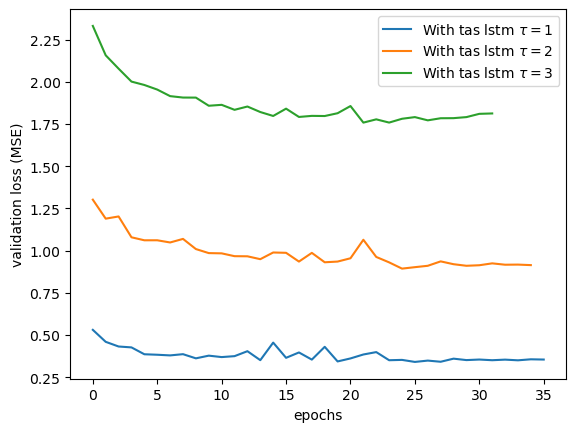

In [19]:
plt.plot(history_psl_zg_pr10_tas_to_tas_ipsl_lag1_lstm["val_loss"], label=r"With tas lstm $\tau =1$")
plt.plot(history_psl_zg_pr10_tas_to_tas_ipsl_lag2_lstm["val_loss"], label=r"With tas lstm $\tau =2$")
plt.plot(history_psl_zg_pr10_tas_to_tas_ipsl_lag3_lstm["val_loss"], label=r"With tas lstm $\tau =3$")
plt.ylabel("validation loss (MSE)")
plt.xlabel("epochs")
plt.legend()
plt.show()

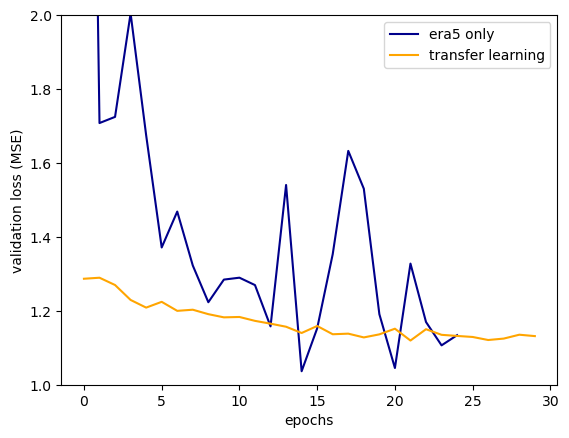

In [20]:
history_psl_zg_pr10_to_tas_era5_lag0 = np.load(
    "/homedata/pchevali/model_preds/psl_zg_pr10_to_tas_era5_lag0.npy", allow_pickle=True
).item()
history_psl_zg_pr10_to_tas_era5_transfer_lag0 = np.load(
    "/homedata/pchevali/model_preds/psl_zg_pr10_to_tas_transfer_era5_lag0.npy", allow_pickle=True
).item()
plt.plot(history_psl_zg_pr10_to_tas_era5_lag0["val_loss"], label="era5 only", color="darkblue")
plt.plot(history_psl_zg_pr10_to_tas_era5_transfer_lag0["val_loss"], label="transfer learning", color="orange")
plt.ylabel("validation loss (MSE)")
plt.xlabel("epochs")
plt.ylim((1,2))
plt.legend()
plt.show()

# Finding the best weights at lag 0 for the weighted analogs

This will be useful as the weights will be those that we keep for the rest.

In [21]:
def compute_infered_mean_analogs(analogs):
    results = []

    for w in tqdm(analogs.w.values):
        analogs_w = analogs.sel(w=w)
        tas_selected = tas_anom_merged["tas"].sel(time=analogs_w["analog_date"])
        tas_infered = tas_selected.mean("analog_number")
        tas_infered = tas_infered.expand_dims(w=[w])
        results.append(tas_infered)

    tas_infered_all = xr.concat(results, dim="w").assign_coords(time=tas_anom_era5.time)
    return tas_infered_all

In [22]:
anal_path = "/homedata/pchevali/analogs/analogs_weighted_era5_to_all_w*"
path_list = glob.glob(anal_path)
analogs_weighted_era5_to_all = xr.open_mfdataset(
    "/homedata/pchevali/analogs/analogs_weighted_era5_to_all_w*",
    combine="nested",
    concat_dim="w",
)
W = [f.split("_")[5].split(".")[0] for f in path_list]
analogs_weighted_era5_to_all["w"] = W
analogs_weighted_era5_to_all.load()
tas_infered = compute_infered_mean_analogs(analogs_weighted_era5_to_all)
rmses_mean = ((tas_anom_era5.tas - tas_infered) ** 2).mean(["lat", "lon", "time"])

  0%|          | 0/50 [00:00<?, ?it/s]

In [23]:
rmses_mean.to_series().sort_values()

w
w22    2.712655
w41    2.772374
w47    2.775046
w39    2.777125
w26    2.795905
w40    2.808743
w48    2.820916
w42    2.823524
w44    2.823857
w35    2.828851
w34    2.841325
w4     2.841360
w10    2.862392
w6     2.864918
w50    2.886406
w17    2.909910
w16    2.917817
w1     2.943737
w23    2.980066
w9     2.994199
w29    2.997515
w7     2.997893
w28    3.016661
w36    3.054673
w19    3.055759
w32    3.096675
w3     3.104731
w20    3.140453
w11    3.140592
w33    3.172242
w27    3.189299
w37    3.191427
w24    3.224932
w13    3.226004
w49    3.284601
w14    3.311650
w5     3.314435
w45    3.326515
w21    3.328001
w46    3.334362
w2     3.356452
w18    3.371937
w30    3.376046
w31    3.396401
w8     3.396643
w25    3.417179
w38    3.459513
w12    3.482629
w43    3.510318
w15    3.659567
Name: tas, dtype: float64

w22 is 0.45 0.45 0.1

In [24]:
del tas_infered, rmses_mean

# Estimation of the commitor function using analogs

In [25]:
n = 5
extremes_era5 = get_indep_maxima(
    data=tas_anom_era5.tas, lat=48.88, lon=2.33, n=n, days_in_between=10
)
q = tas_anom_era5.tas.sel(lat=48.88, lon=2.33, method="nearest").quantile(0.98).values

In [26]:
def analogs_eval(anal):
    means_global = []
    maxs_global = []
    commitors_global = []
    raw_global = []
    taus = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]
    mask = np.isin(decode_index(tas_anom_era5.time.values, "month"), [6, 7, 8])
    for i in tqdm(range(200)):
        day = np.random.choice(tas_anom_era5.sel(time=mask).time)
        means_global.append([])
        maxs_global.append([])
        commitors_global.append([])
        raw_global.append([])
        for tau in taus:
            t_moins_tau = add_days_from_index(day, -tau)
            t_moins_tau_tildes = anal.analog_date.sel(time=t_moins_tau).values
            temp_mask = np.isin(
                decode_index(t_moins_tau_tildes, "month"), [5, 6, 7, 8]
            )  # making sure going forward in time didn't give us dates we don't have (happens when the analogue is in september)
            t_0_tildes = add_days_from_index(t_moins_tau_tildes[temp_mask], tau)
            T_t0_tildes = (
                tas_anom_merged.tas.sel(time=t_0_tildes)
                .sel(lat=48.88, lon=2.33, method="nearest")
                .values
            )
            raw_global[i].append(np.array(T_t0_tildes))
            means_global[i].append(np.mean(T_t0_tildes))
            maxs_global[i].append(np.max(T_t0_tildes))
            commitors_global[i].append(np.mean(T_t0_tildes >= q))
    means_global = np.array(means_global)
    maxs_global = np.array(maxs_global)
    commitors_global = np.array(commitors_global)
    means = []
    maxs = []
    commitors = []
    raw = []
    taus = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]
    for i in range(len(extremes_era5.index)):
        day = extremes_era5.index[i]
        raw.append([])
        means.append([])
        maxs.append([])
        commitors.append([])
        for tau in taus:
            t_moins_tau = add_days_from_index(day, -tau)
            t_moins_tau_tildes = anal.analog_date.sel(time=t_moins_tau).values
            temp_mask = np.isin(
                decode_index(t_moins_tau_tildes, "month"), [5, 6, 7, 8]
            )  # making sure going forward in time didn't give us dates we don't have (happens when the analogue is in september)
            t_0_tildes = add_days_from_index(t_moins_tau_tildes[temp_mask], tau)
            T_t0_tildes = (
                tas_anom_merged.tas.sel(time=t_0_tildes)
                .sel(lat=48.88, lon=2.33, method="nearest")
                .values
            )
            raw[i].append(np.array(T_t0_tildes))
            means[i].append(np.mean(T_t0_tildes))
            maxs[i].append(np.max(T_t0_tildes))
            commitors[i].append(np.mean(T_t0_tildes >= q))
    means = np.array(means)
    maxs = np.array(maxs)
    commitors = np.array(commitors)

    plt.figure(figsize=(8, 6))
    plt.plot(
        taus,
        means_global.mean(axis=0),
        "o-",
        label='Mean "global" predicted anomaly',
        color="blue",
    )
    plt.plot(
        taus,
        means.mean(axis=0),
        "o-",
        label="Mean extreme predicted anomaly",
        color="red",
    )
    plt.xlabel(r"$\tau$ days before")
    plt.ylabel("Temperature anomaly(°C)")
    plt.hlines(0, xmin=0, xmax=10, color="lime", label="Mean anomaly", alpha=0.5)
    plt.legend(loc="upper right")
    plt.xticks(taus)
    plt.grid()
    # plt.title("Mean predicted anomaly of extremes depending on tau")
    plt.show()

    plt.figure(figsize=(8, 6))
    plt.plot(taus, commitors.mean(axis=0) * 100, "o-", label="Extremes", color="r")
    plt.plot(
        taus,
        np.repeat(commitors_global.mean(), 16) * 100,
        "-",
        label="Global",
        color="b",
    )
    plt.xlabel(r"$\tau$ days before")
    plt.ylabel(r"$100\times$Commitor")
    plt.legend(loc="upper right")
    plt.xticks(taus)
    plt.grid()
    # plt.title("Mean committor estimate depending on tau")
    plt.show()

    plt.figure(figsize=(8, 6))
    plt.plot(
        taus, commitors.mean(axis=0) / commitors_global.mean(), "o-", color="orange"
    )
    plt.hlines(1, xmin=0, xmax=15, color="blue", alpha=0.5)
    plt.xlabel(r"$\tau$ days before")
    plt.ylabel(r"$\frac{Committor}{Noise}$")
    plt.xticks(taus)
    plt.grid()
    # plt.title("Mean committor estimate divided by the noise depending on tau")
    plt.show()

    plt.figure(figsize=(8, 6))
    for i in range(int(len(raw_global) / 4)):
        for tau in range(len(raw_global[i])):
            plt.plot(
                np.repeat(tau, len(raw_global[i][tau])),
                raw_global[i][tau],
                "o",
                label='Mean "global" predicted anomaly',
                color="blue",
                markersize=3,
                alpha=0.5,
            )
    for i in range(len(extremes_era5.index)):
        for tau in range(len(raw[i])):
            plt.plot(
                np.repeat(tau, len(raw[i][tau])),
                raw[i][tau],
                "o",
                label='Mean "global" predicted anomaly',
                color="red",
                markersize=2,
                alpha=1,
            )

    plt.xlabel(r"$\tau$ days before")
    plt.ylabel("Temperature anomaly(°C)")
    plt.hlines(0, xmin=0, xmax=15, color="lime", label="Mean anomaly", alpha=0.5)
    plt.hlines(q, xmin=0, xmax=15, color="red", label="Mean anomaly", alpha=0.5)
    # plt.legend(loc="upper right")
    plt.xticks(taus)
    plt.grid()
    # plt.title("All estimations depending on tau")
    plt.show()

    i = 0
    for tau in range(len(raw[i])):
        plt.plot(
            np.repeat(tau, len(raw[i][tau])),
            raw[i][tau],
            "o",
            label='Mean "global" predicted anomaly',
            color="red",
            markersize=3,
            alpha=1,
        )
    plt.xlabel(r"$\tau$ days before")
    plt.ylabel("Temperature anomaly(°C)")
    plt.hlines(0, xmin=0, xmax=15, color="lime", label="Mean anomaly", alpha=0.5)
    plt.hlines(q, xmin=0, xmax=15, color="red", label="Mean anomaly", alpha=0.5)
    # plt.legend(loc="upper right")
    plt.xticks(taus)
    plt.grid()
    # plt.title("All estimations for one specific extreme")
    plt.show()

  0%|          | 0/200 [00:00<?, ?it/s]

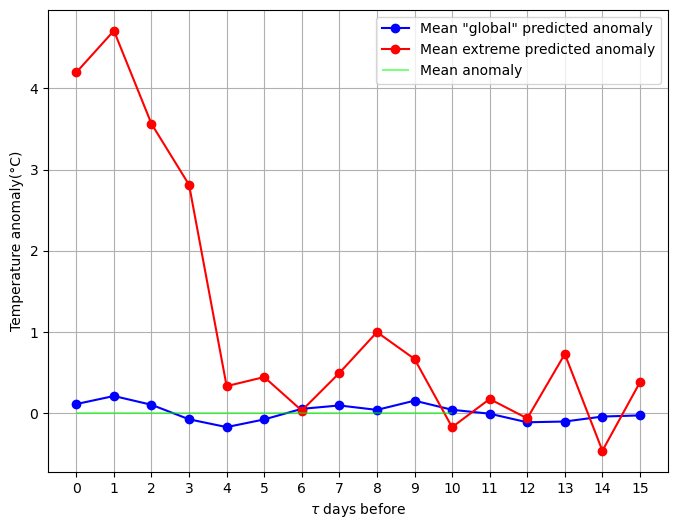

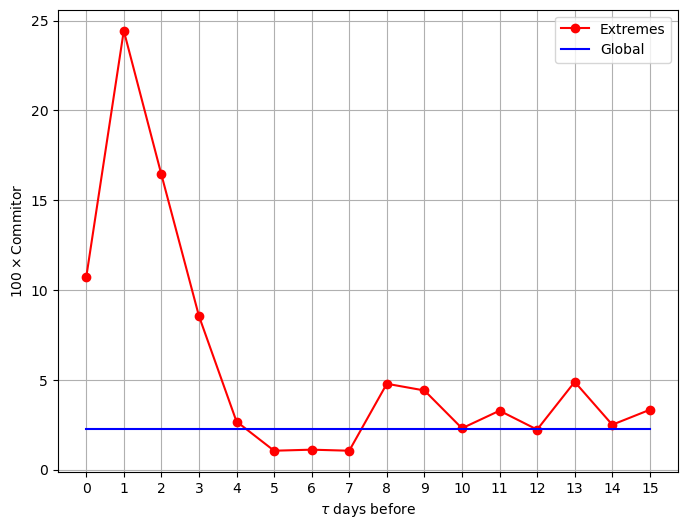

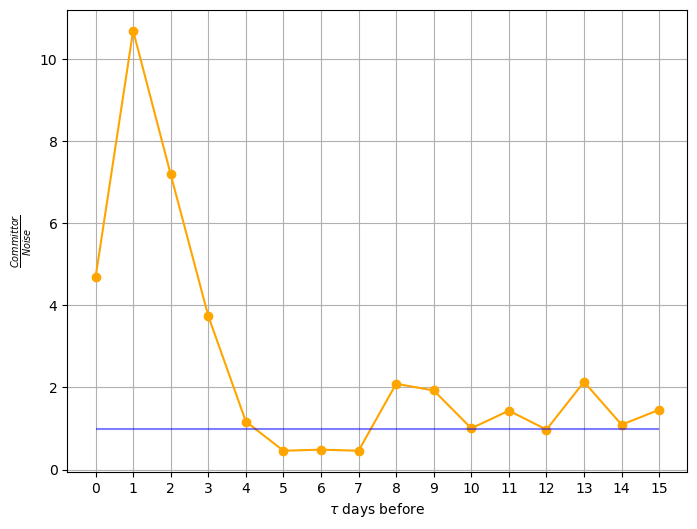

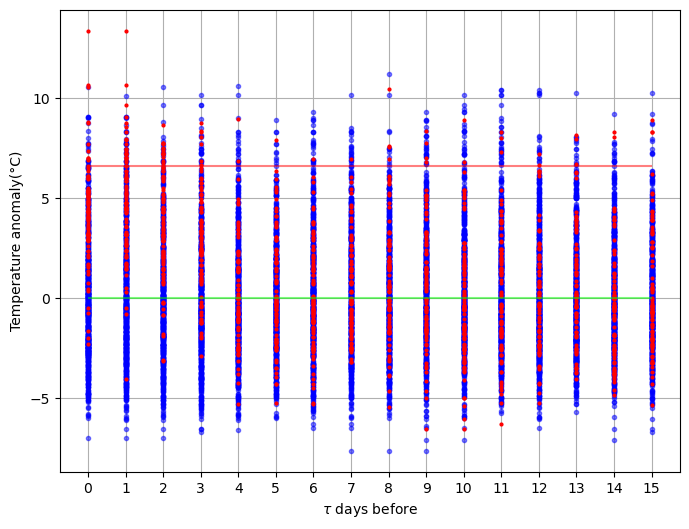

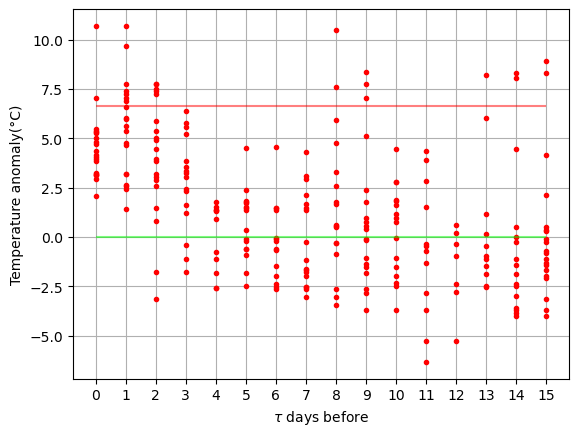

In [27]:
analogs_eval(analogs_weighted_era5_to_era5)

  0%|          | 0/200 [00:00<?, ?it/s]

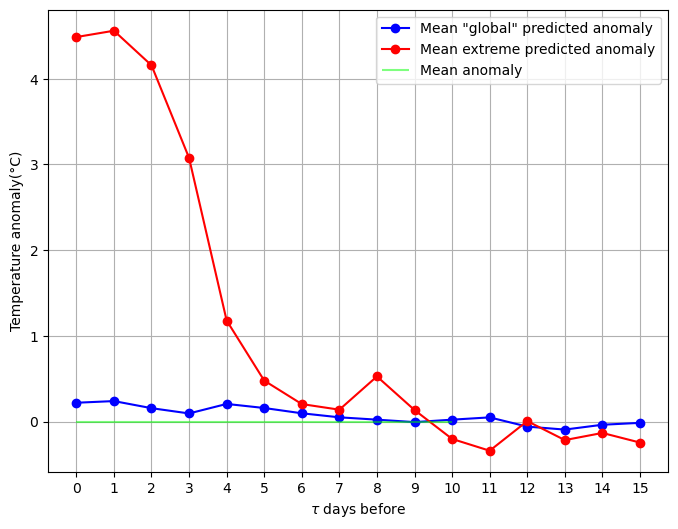

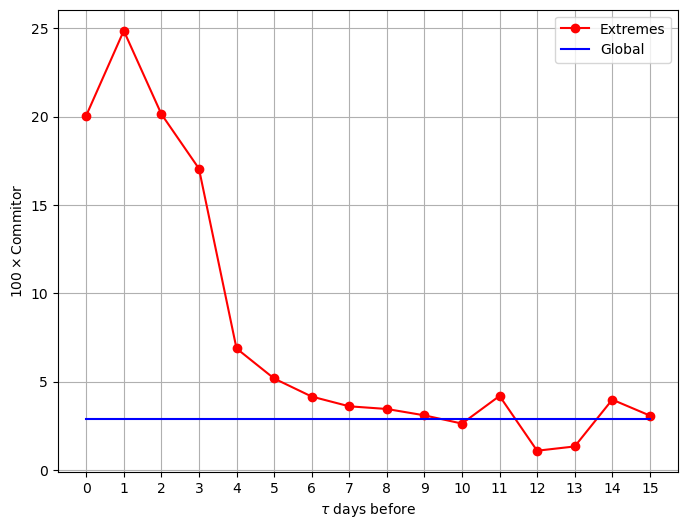

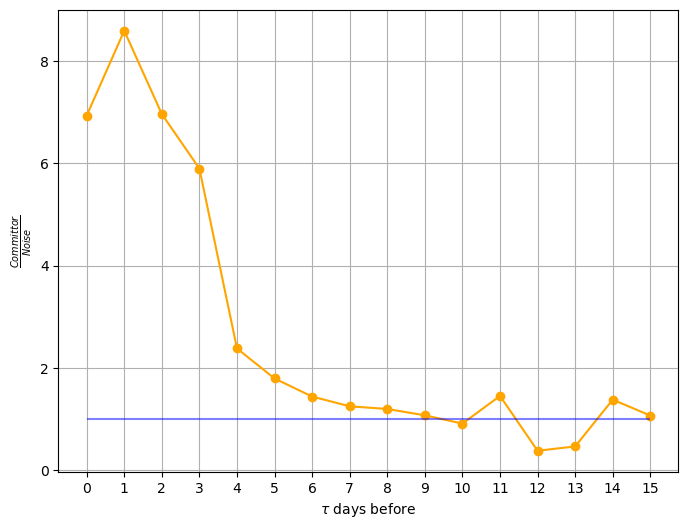

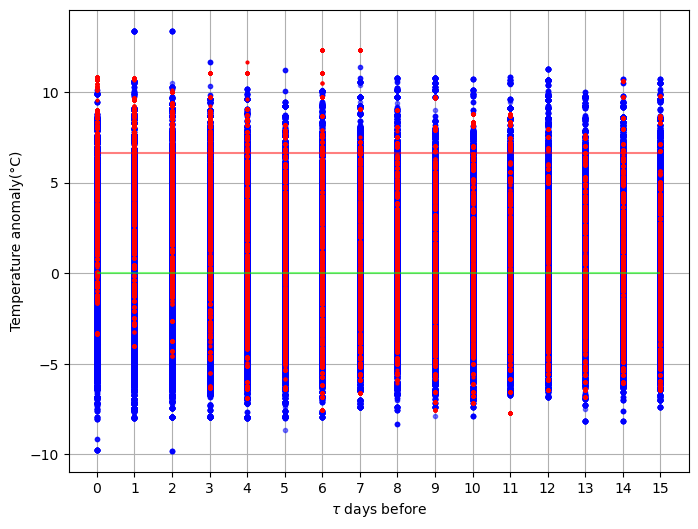

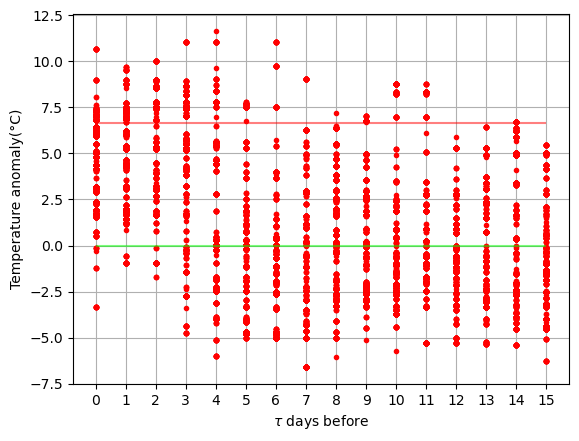

In [28]:
analogs_eval(analogs_weighted_era5_to_all)

  0%|          | 0/200 [00:00<?, ?it/s]

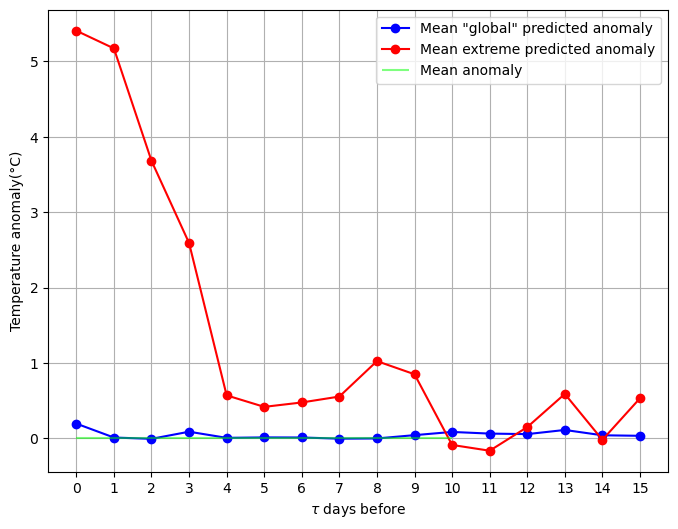

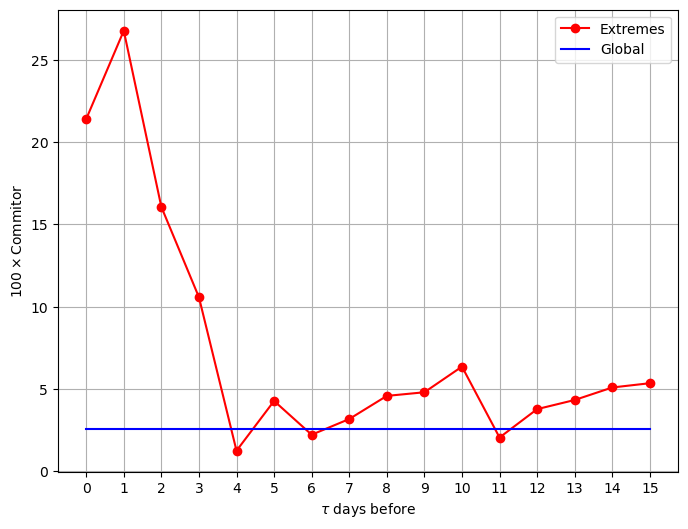

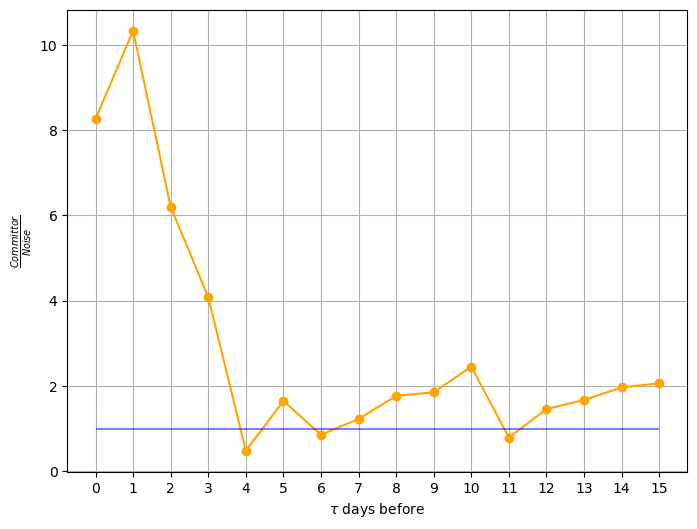

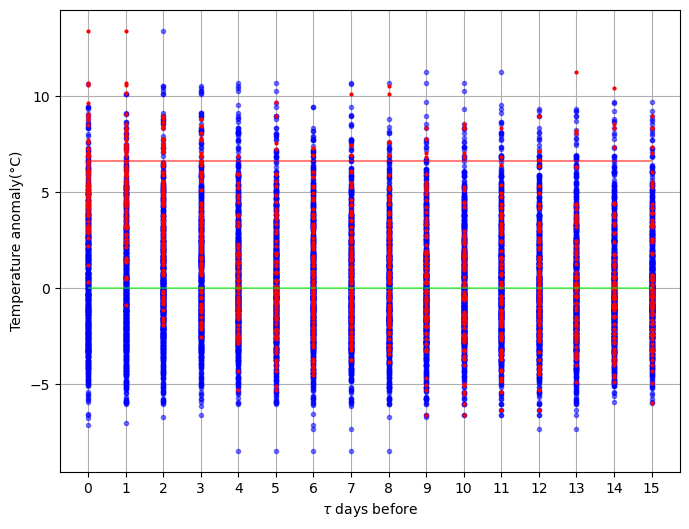

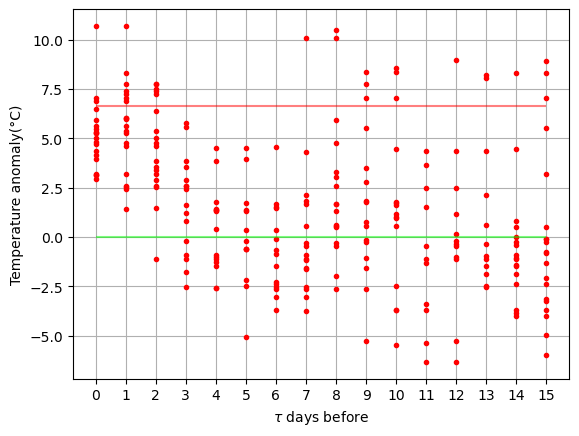

In [29]:
analogs_eval(analogs_weighted_with_tas_era5_to_era5)

  0%|          | 0/200 [00:00<?, ?it/s]

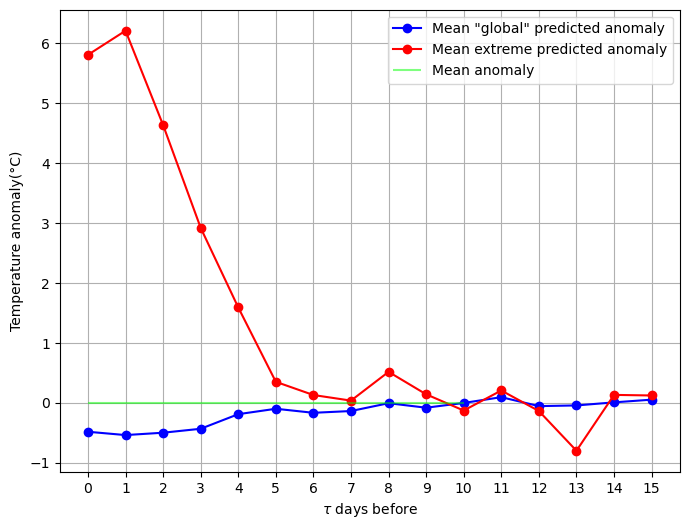

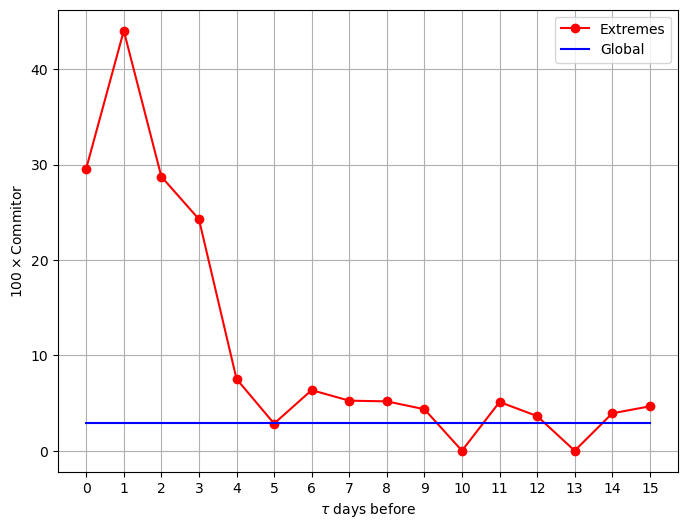

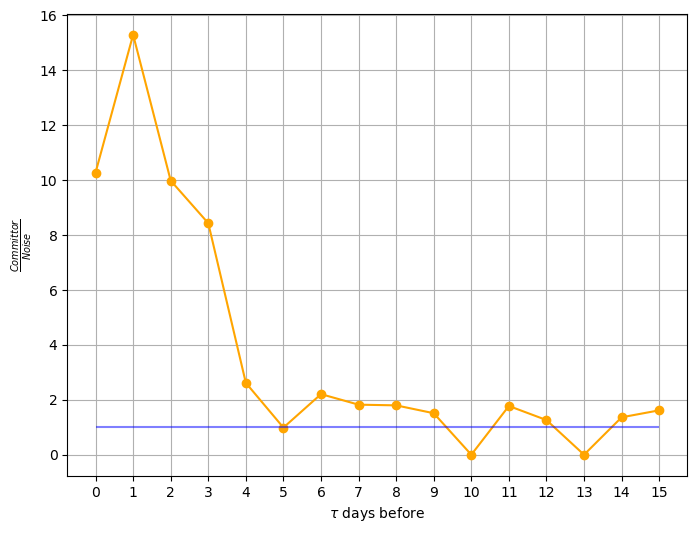

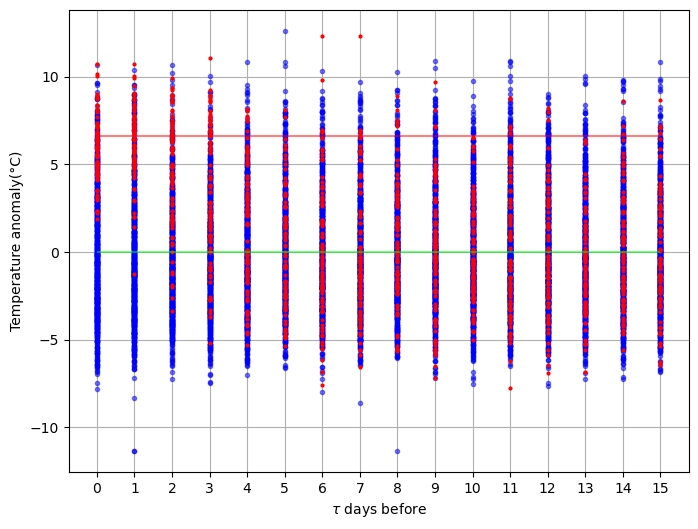

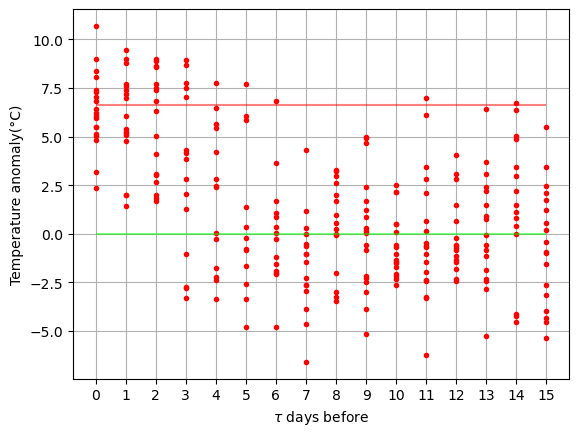

In [30]:
analogs_eval(analogs_weighted_with_tas_era5_to_all)

  0%|          | 0/200 [00:00<?, ?it/s]

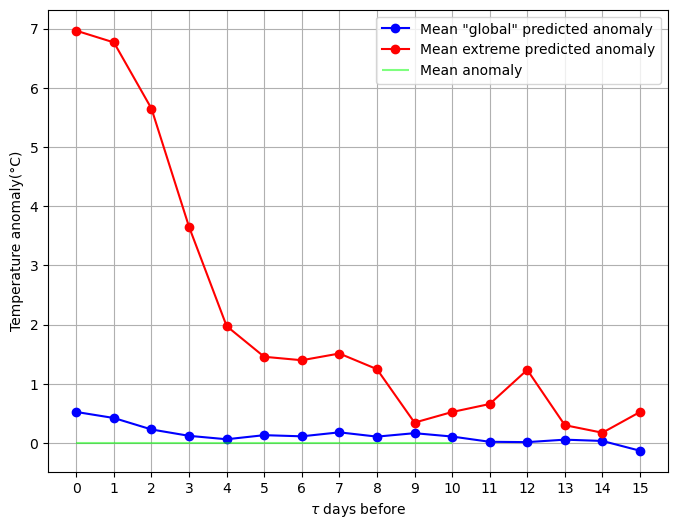

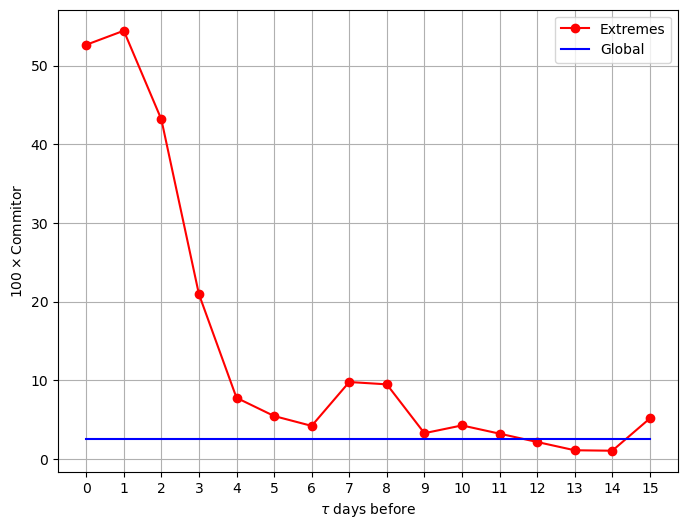

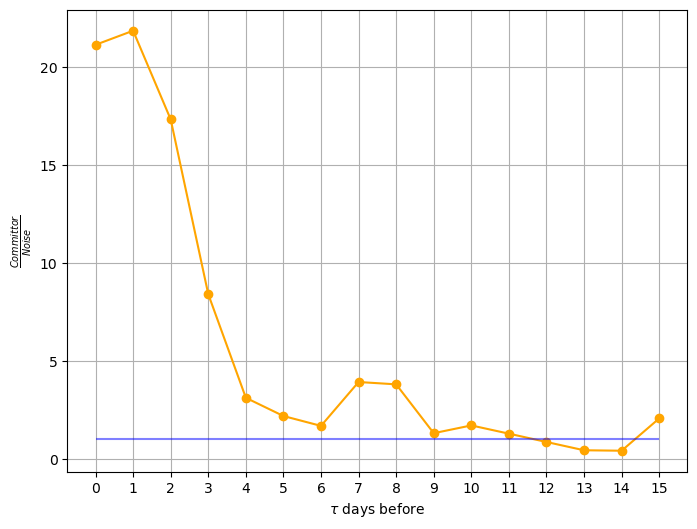

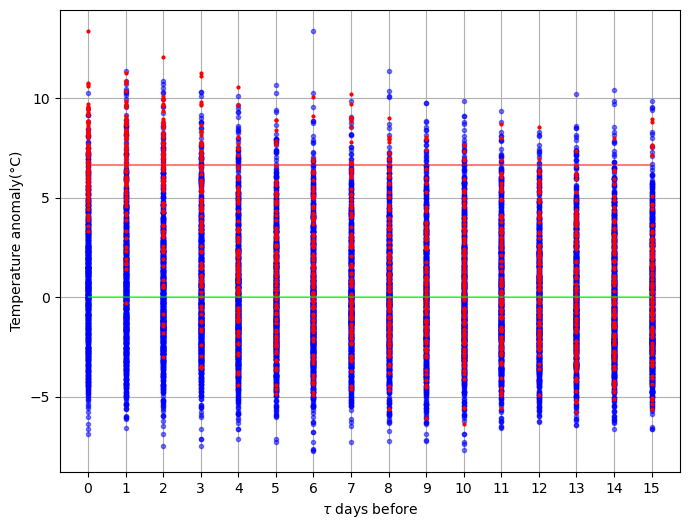

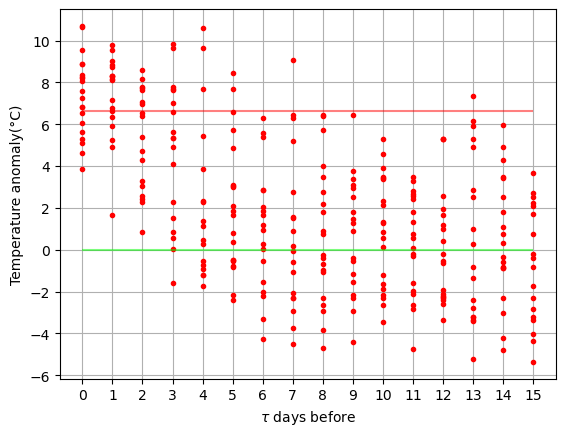

In [31]:
analogs_eval(analogs_weighted_with_tas_era5_to_all_ranked)

# evaluate analogs

In [32]:
def analogs_hist(anal,tau=0):
    mask = np.isin(decode_index(tas_anom_era5.time.values, "month"), [6, 7, 8])
    
    temperatures = []
    predicted_temperatures = []
    commitors = []
    
    for day in tas_anom_era5.time.values[mask]:  # select all dates that won't cause problems
        t_moins_tau = add_days_from_index(day, -tau)
        t_moins_tau_tildes = anal.analog_date.sel(time=t_moins_tau).values
        temp_mask = np.isin(
                decode_index(t_moins_tau_tildes, "month"), [5, 6, 7, 8]
        )  # making sure going forward in time didn't give us dates we don't have (happens when the analogue is in september)
        t_0_tildes = add_days_from_index(t_moins_tau_tildes[temp_mask], tau)
        T_t0_tildes = (
                tas_anom_merged.tas.sel(time=t_0_tildes)
                .sel(lat=48.88, lon=2.33, method="nearest")
                .values
        )
        temperatures.append(
            tas_anom_merged.tas.sel(time=day).sel(lat=48.88, lon=2.33, method="nearest").values
        )
        commitors.append(np.mean(T_t0_tildes >= q))
        predicted_temperatures.append(np.mean(T_t0_tildes))
    temperatures = np.array(temperatures)
    predicted_temperatures = np.array(predicted_temperatures)
    commitors = np.array(commitors)

    plt.scatter(temperatures,commitors,s=0.5)
    plt.vlines(q, ymin=0, ymax=1, color="red", label=r"$T_{extreme}$", alpha=0.5)
    plt.ylabel("Committor estimation")
    plt.xlabel("Real temperature")
    plt.show()

    plt.figure(figsize=(6, 6))
    plt.hist(
        temperatures, density=True, label="Mean temperature anomaly distribution", bins=20
    )
    plt.hist(
        temperatures[commitors >= 20 / 100],
        density=True,
        label="Mean temperature anomaly distribution \n | commitor $\geq$ 0.2",
        alpha=0.5,
        bins=20,
        color="r",
    )
    plt.xlabel("Temperature anomaly (°C)")
    plt.ylabel("Density")
    plt.legend(loc="upper left")
    plt.show()

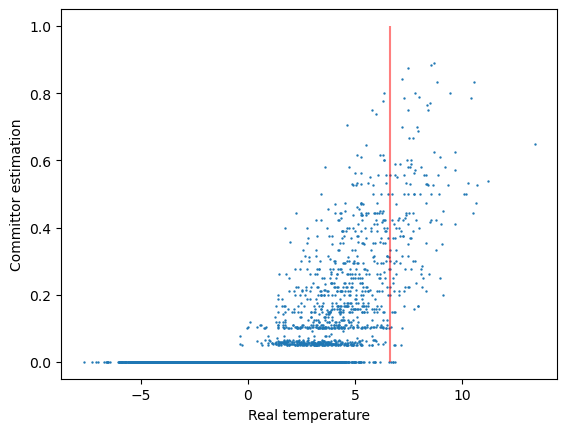

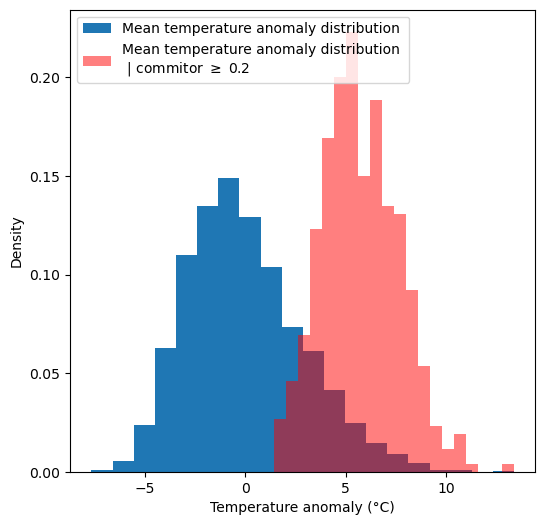

In [33]:
analogs_hist(analogs_weighted_with_tas_era5_to_all_ranked,0)

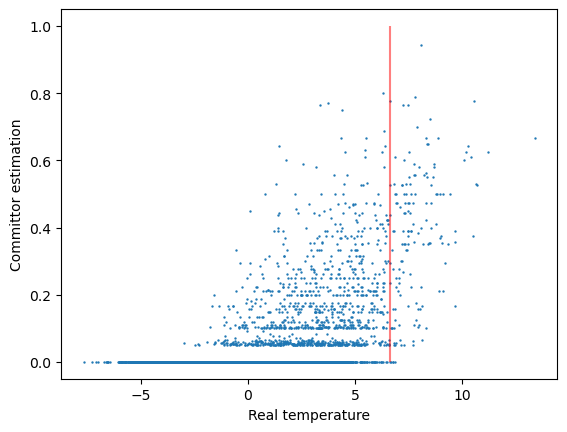

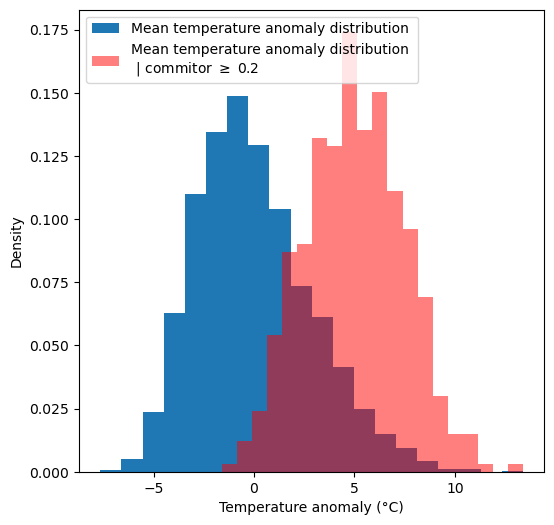

In [34]:
analogs_hist(analogs_weighted_with_tas_era5_to_all_ranked,1)

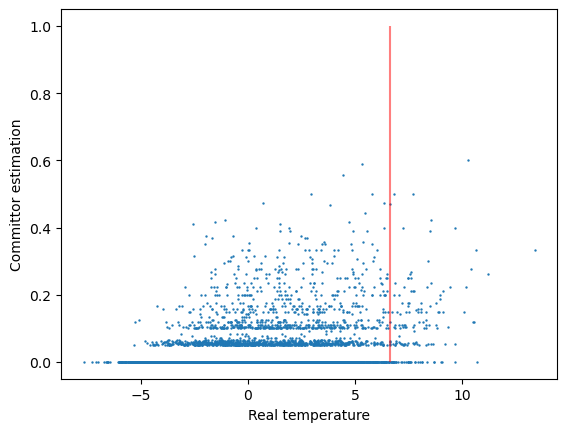

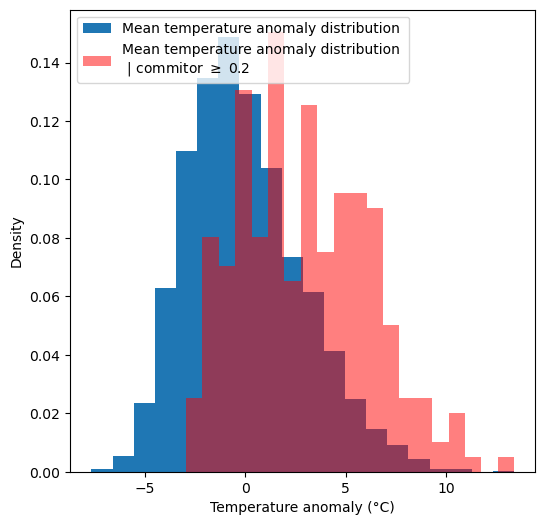

In [35]:
analogs_hist(analogs_weighted_with_tas_era5_to_all_ranked,3)

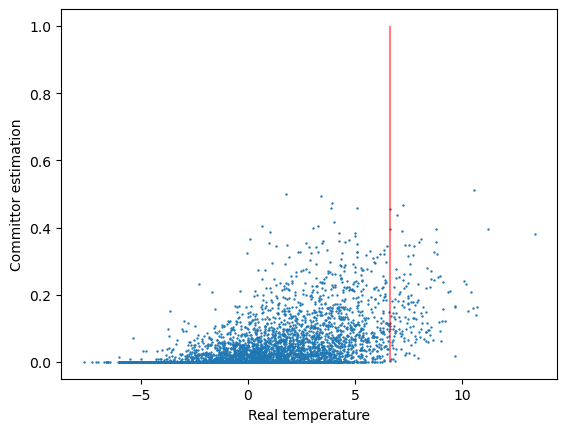

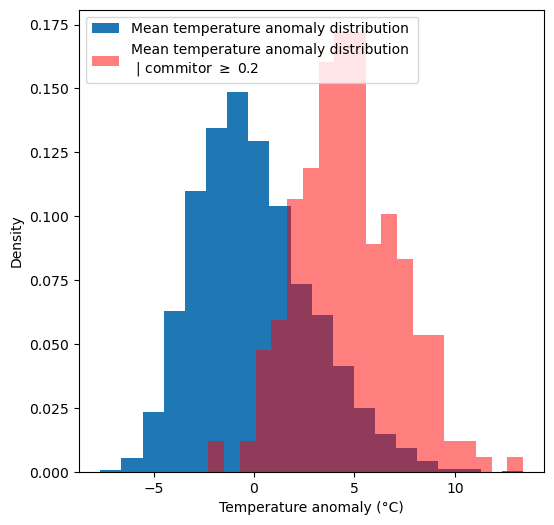

In [36]:
analogs_hist(analogs_weighted_era5_to_all,1)

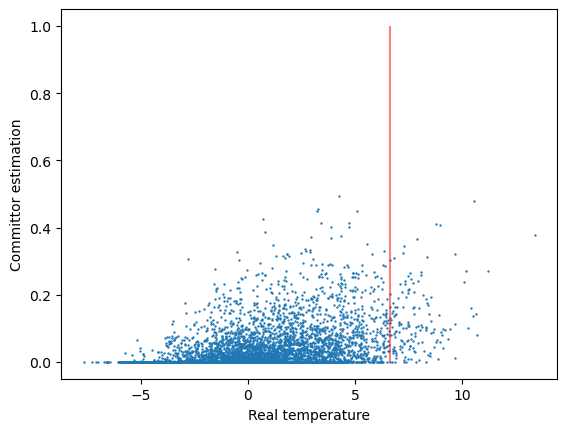

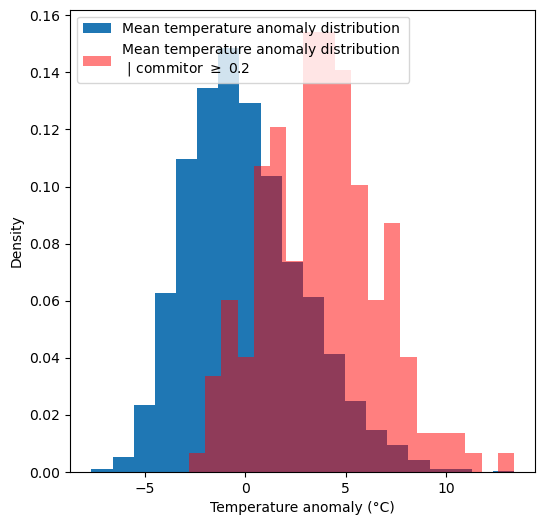

In [37]:
analogs_hist(analogs_weighted_era5_to_all,2)

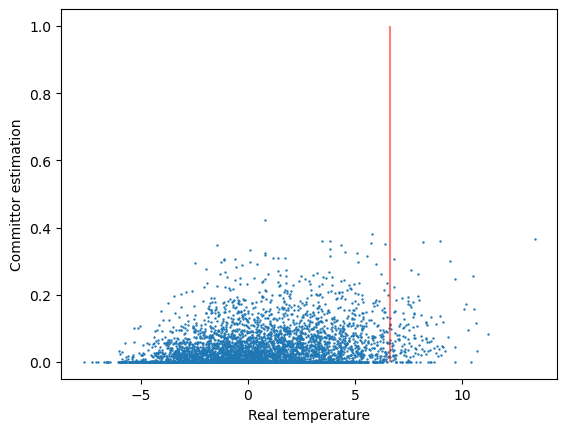

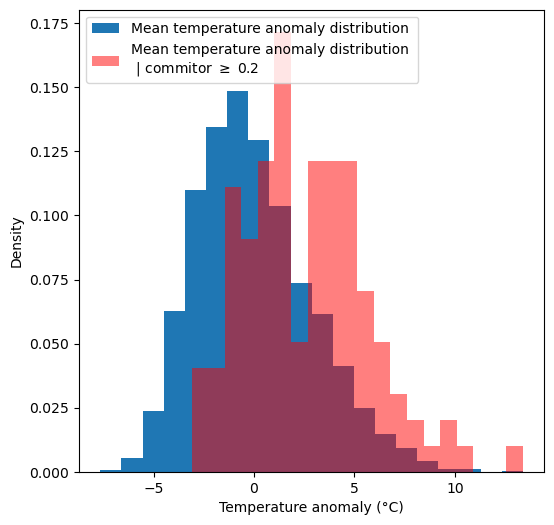

In [38]:
analogs_hist(analogs_weighted_era5_to_all,3)

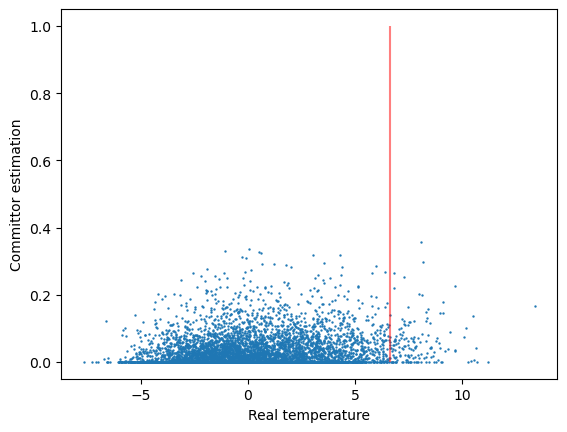

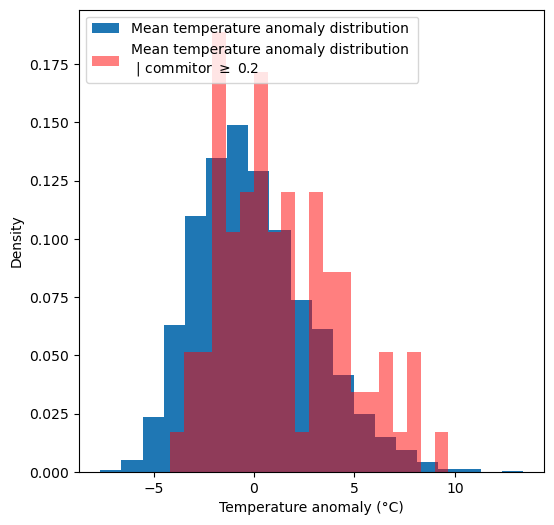

In [39]:
analogs_hist(analogs_weighted_era5_to_all,4)

SWG

# Figures rapport

In [40]:
n = 5
extremes_era5 = get_indep_maxima(
    data=tas_anom_era5.tas, lat=48.88, lon=2.33, n=n, days_in_between=10
)
q = tas_anom_era5.tas.sel(lat=48.88, lon=2.33, method="nearest").quantile(0.98).values

## Résultats analogues

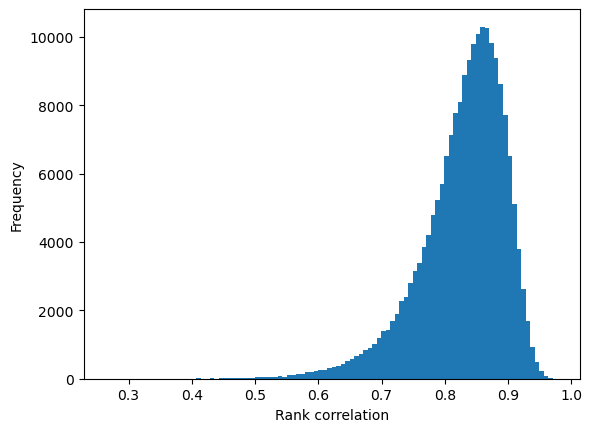

In [41]:
analogs_zg_era5_to_all.rank_corr.plot.hist(bins=100)
plt.ylabel("Frequency")
plt.xlabel("Rank correlation")
plt.show()

In [42]:
threshold = np.percentile(
    analogs_zg_era5_to_all.rank_corr.values.flatten(),
    5
)

print("Seuil 95% supérieur :", threshold)


Seuil 95% supérieur : 0.6988355904336339


In [43]:
analogs_notl = xr.open_dataset(
    "/homedata/pchevali/analogs/analogs_weighted_era5_to_era5_ranked.nc"
)
analogs_tl = xr.open_dataset(
    "/homedata/pchevali/analogs/analogs_weighted_era5_to_all_ranked.nc"
)

In [44]:
anal=analogs_notl
means_notl_global = []
commitors_notl_global = []
raw_notl_global = []
taus = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]
mask = np.isin(decode_index(tas_anom_era5.time.values, "month"), [6, 7, 8])
for i in tqdm(range(200)):
    day = np.random.choice(tas_anom_era5.sel(time=mask).time)
    means_notl_global.append([])
    commitors_notl_global.append([])
    raw_notl_global.append([])
    for tau in taus:
        t_moins_tau = add_days_from_index(day, -tau)
        t_moins_tau_tildes = anal.analog_date.sel(time=t_moins_tau).values
        temp_mask = np.isin(
            decode_index(t_moins_tau_tildes, "month"), [5, 6, 7, 8]
        )  # making sure going forward in time didn't give us dates we don't have (happens when the analogue is in september)
        t_0_tildes = add_days_from_index(t_moins_tau_tildes[temp_mask], tau)
        T_t0_tildes = (
            tas_anom_merged.tas.sel(time=t_0_tildes)
            .sel(lat=48.88, lon=2.33, method="nearest")
            .values
        )
        raw_notl_global[i].append(np.array(T_t0_tildes))
        means_notl_global[i].append(np.mean(T_t0_tildes))
        commitors_notl_global[i].append(np.mean(T_t0_tildes >= q))
means_notl_global = np.array(means_notl_global)
commitors_notl_global = np.array(commitors_notl_global)
means_notl = []
commitors_notl = []
raw_notl = []
taus = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]
for i in range(len(extremes_era5.index)):
    day = extremes_era5.index[i]
    raw_notl.append([])
    means_notl.append([])
    commitors_notl.append([])
    for tau in taus:
        t_moins_tau = add_days_from_index(day, -tau)
        t_moins_tau_tildes = anal.analog_date.sel(time=t_moins_tau).values
        temp_mask = np.isin(
            decode_index(t_moins_tau_tildes, "month"), [5, 6, 7, 8]
        )  # making sure going forward in time didn't give us dates we don't have (happens when the analogue is in september)
        t_0_tildes = add_days_from_index(t_moins_tau_tildes[temp_mask], tau)
        T_t0_tildes = (
            tas_anom_merged.tas.sel(time=t_0_tildes)
            .sel(lat=48.88, lon=2.33, method="nearest")
            .values
        )
        raw_notl[i].append(np.array(T_t0_tildes))
        means_notl[i].append(np.mean(T_t0_tildes))
        commitors_notl[i].append(np.mean(T_t0_tildes >= q))
means_notl = np.array(means_notl)
commitors_notl = np.array(commitors_notl)

  0%|          | 0/200 [00:00<?, ?it/s]

In [45]:
anal=analogs_tl
means_tl_global = []
commitors_tl_global = []
raw_tl_global = []
taus = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]
mask = np.isin(decode_index(tas_anom_era5.time.values, "month"), [6, 7, 8])
for i in tqdm(range(200)):
    day = np.random.choice(tas_anom_era5.sel(time=mask).time)
    means_tl_global.append([])
    commitors_tl_global.append([])
    raw_tl_global.append([])
    for tau in taus:
        t_moins_tau = add_days_from_index(day, -tau)
        t_moins_tau_tildes = anal.analog_date.sel(time=t_moins_tau).values
        temp_mask = np.isin(
            decode_index(t_moins_tau_tildes, "month"), [5, 6, 7, 8]
        )  # making sure going forward in time didn't give us dates we don't have (happens when the analogue is in september)
        t_0_tildes = add_days_from_index(t_moins_tau_tildes[temp_mask], tau)
        T_t0_tildes = (
            tas_anom_merged.tas.sel(time=t_0_tildes)
            .sel(lat=48.88, lon=2.33, method="nearest")
            .values
        )
        raw_tl_global[i].append(np.array(T_t0_tildes))
        means_tl_global[i].append(np.mean(T_t0_tildes))
        commitors_tl_global[i].append(np.mean(T_t0_tildes >= q))
means_tl_global = np.array(means_tl_global)
commitors_tl_global = np.array(commitors_tl_global)
means_tl = []
commitors_tl = []
raw_tl = []
taus = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]
for i in range(len(extremes_era5.index)):
    day = extremes_era5.index[i]
    raw_tl.append([])
    means_tl.append([])
    commitors_tl.append([])
    for tau in taus:
        t_moins_tau = add_days_from_index(day, -tau)
        t_moins_tau_tildes = anal.analog_date.sel(time=t_moins_tau).values
        temp_mask = np.isin(
            decode_index(t_moins_tau_tildes, "month"), [5, 6, 7, 8]
        )  # making sure going forward in time didn't give us dates we don't have (happens when the analogue is in september)
        t_0_tildes = add_days_from_index(t_moins_tau_tildes[temp_mask], tau)
        T_t0_tildes = (
            tas_anom_merged.tas.sel(time=t_0_tildes)
            .sel(lat=48.88, lon=2.33, method="nearest")
            .values
        )
        raw_tl[i].append(np.array(T_t0_tildes))
        means_tl[i].append(np.mean(T_t0_tildes))
        commitors_tl[i].append(np.mean(T_t0_tildes >= q))
means_tl = np.array(means_tl)
commitors_tl = np.array(commitors_tl)

  0%|          | 0/200 [00:00<?, ?it/s]

In [46]:
anal=analogs_weighted_with_tas_era5_to_all_ranked
means_tl_tas_global = []
commitors_tl_tas_global = []
raw_tl_tas_global = []
taus = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]
mask = np.isin(decode_index(tas_anom_era5.time.values, "month"), [6, 7, 8])
for i in tqdm(range(200)):
    day = np.random.choice(tas_anom_era5.sel(time=mask).time)
    means_tl_tas_global.append([])
    commitors_tl_tas_global.append([])
    raw_tl_tas_global.append([])
    for tau in taus:
        t_moins_tau = add_days_from_index(day, -tau)
        t_moins_tau_tildes = anal.analog_date.sel(time=t_moins_tau).values
        temp_mask = np.isin(
            decode_index(t_moins_tau_tildes, "month"), [5, 6, 7, 8]
        )  # making sure going forward in time didn't give us dates we don't have (happens when the analogue is in september)
        t_0_tildes = add_days_from_index(t_moins_tau_tildes[temp_mask], tau)
        T_t0_tildes = (
            tas_anom_merged.tas.sel(time=t_0_tildes)
            .sel(lat=48.88, lon=2.33, method="nearest")
            .values
        )
        raw_tl_tas_global[i].append(np.array(T_t0_tildes))
        means_tl_tas_global[i].append(np.mean(T_t0_tildes))
        commitors_tl_tas_global[i].append(np.mean(T_t0_tildes >= q))
means_tl_tas_global = np.array(means_tl_tas_global)
commitors_tl_tas_global = np.array(commitors_tl_tas_global)
means_tl_tas = []
commitors_tl_tas = []
raw_tl_tas = []
taus = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]
for i in range(len(extremes_era5.index)):
    day = extremes_era5.index[i]
    raw_tl_tas.append([])
    means_tl_tas.append([])
    commitors_tl_tas.append([])
    for tau in taus:
        t_moins_tau = add_days_from_index(day, -tau)
        t_moins_tau_tildes = anal.analog_date.sel(time=t_moins_tau).values
        temp_mask = np.isin(
            decode_index(t_moins_tau_tildes, "month"), [5, 6, 7, 8]
        )  # making sure going forward in time didn't give us dates we don't have (happens when the analogue is in september)
        t_0_tildes = add_days_from_index(t_moins_tau_tildes[temp_mask], tau)
        T_t0_tildes = (
            tas_anom_merged.tas.sel(time=t_0_tildes)
            .sel(lat=48.88, lon=2.33, method="nearest")
            .values
        )
        raw_tl_tas[i].append(np.array(T_t0_tildes))
        means_tl_tas[i].append(np.mean(T_t0_tildes))
        commitors_tl_tas[i].append(np.mean(T_t0_tildes >= q))
means_tl_tas = np.array(means_tl_tas)
commitors_tl_tas = np.array(commitors_tl_tas)

  0%|          | 0/200 [00:00<?, ?it/s]

In [47]:
anal=analogs_weighted_with_tas_era5_to_era5_ranked
means_notl_tas_global = []
commitors_notl_tas_global = []
raw_notl_tas_global = []
taus = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]
mask = np.isin(decode_index(tas_anom_era5.time.values, "month"), [6, 7, 8])
for i in tqdm(range(200)):
    day = np.random.choice(tas_anom_era5.sel(time=mask).time)
    means_notl_tas_global.append([])
    commitors_notl_tas_global.append([])
    raw_notl_tas_global.append([])
    for tau in taus:
        t_moins_tau = add_days_from_index(day, -tau)
        t_moins_tau_tildes = anal.analog_date.sel(time=t_moins_tau).values
        temp_mask = np.isin(
            decode_index(t_moins_tau_tildes, "month"), [5, 6, 7, 8]
        )  # making sure going forward in time didn't give us dates we don't have (happens when the analogue is in september)
        t_0_tildes = add_days_from_index(t_moins_tau_tildes[temp_mask], tau)
        T_t0_tildes = (
            tas_anom_merged.tas.sel(time=t_0_tildes)
            .sel(lat=48.88, lon=2.33, method="nearest")
            .values
        )
        raw_notl_tas_global[i].append(np.array(T_t0_tildes))
        means_notl_tas_global[i].append(np.mean(T_t0_tildes))
        commitors_notl_tas_global[i].append(np.mean(T_t0_tildes >= q))
means_notl_tas_global = np.array(means_notl_tas_global)
commitors_notl_tas_global = np.array(commitors_notl_tas_global)
means_notl_tas = []
commitors_notl_tas = []
raw_notl_tas = []
taus = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]
for i in range(len(extremes_era5.index)):
    day = extremes_era5.index[i]
    raw_notl_tas.append([])
    means_notl_tas.append([])
    commitors_notl_tas.append([])
    for tau in taus:
        t_moins_tau = add_days_from_index(day, -tau)
        t_moins_tau_tildes = anal.analog_date.sel(time=t_moins_tau).values
        temp_mask = np.isin(
            decode_index(t_moins_tau_tildes, "month"), [5, 6, 7, 8]
        )  # making sure going forward in time didn't give us dates we don't have (happens when the analogue is in september)
        t_0_tildes = add_days_from_index(t_moins_tau_tildes[temp_mask], tau)
        T_t0_tildes = (
            tas_anom_merged.tas.sel(time=t_0_tildes)
            .sel(lat=48.88, lon=2.33, method="nearest")
            .values
        )
        raw_notl_tas[i].append(np.array(T_t0_tildes))
        means_notl_tas[i].append(np.mean(T_t0_tildes))
        commitors_notl_tas[i].append(np.mean(T_t0_tildes >= q))
means_notl_tas = np.array(means_notl_tas)
commitors_notl_tas = np.array(commitors_notl_tas)

  0%|          | 0/200 [00:00<?, ?it/s]

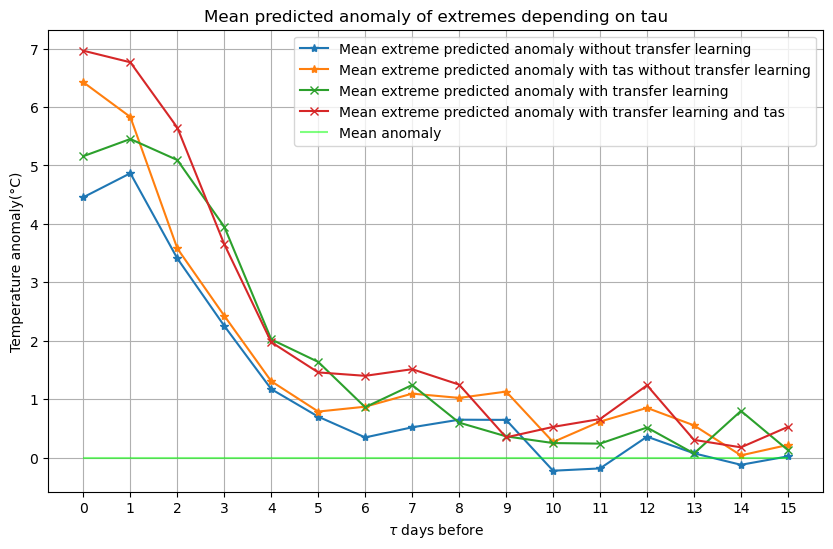

In [48]:
plt.figure(figsize=(10, 6))
plt.plot(
    taus,
    means_notl.mean(axis=0),
    "*-",
    label="Mean extreme predicted anomaly without transfer learning",
)
plt.plot(
    taus,
    means_notl_tas.mean(axis=0),
    "*-",
    label="Mean extreme predicted anomaly with tas without transfer learning",
)
plt.plot(
    taus,
    means_tl.mean(axis=0),
    "x-",
    label="Mean extreme predicted anomaly with transfer learning",
)
plt.plot(
    taus,
    means_tl_tas.mean(axis=0),
    "x-",
    label="Mean extreme predicted anomaly with transfer learning and tas",
)
plt.xlabel(r"$\tau$ days before")
plt.ylabel("Temperature anomaly(°C)")
plt.hlines(0, xmin=0, xmax=15, color="lime", label="Mean anomaly", alpha=0.5)
plt.legend(loc="upper right")
plt.xticks(taus)
plt.grid()
plt.title("Mean predicted anomaly of extremes depending on tau")
plt.show()

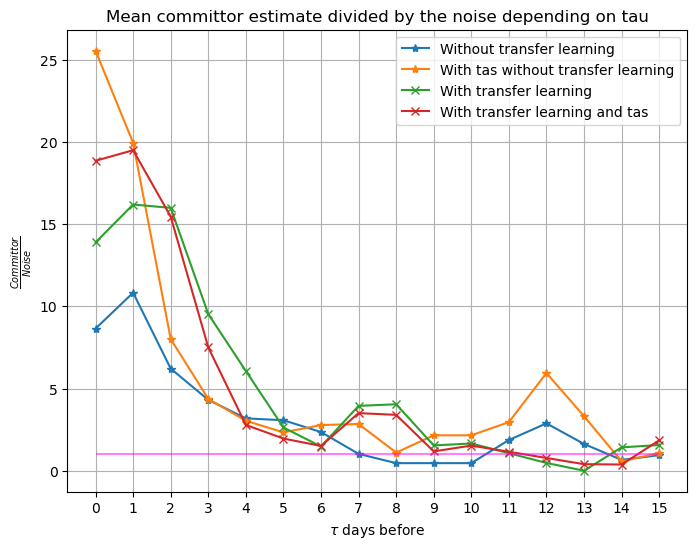

In [215]:
plt.figure(figsize=(8, 6))
plt.plot(
    taus, commitors_notl.mean(axis=0)/commitors_notl_global.mean(), "*-", label="Without transfer learning"
)
plt.plot(
    taus, commitors_notl_tas.mean(axis=0)/commitors_notl_tas_global.mean(), "*-", label="With tas without transfer learning"
)
plt.plot(
    taus, commitors_tl.mean(axis=0)/commitors_tl_global.mean(), "x-", label="With transfer learning"
)
plt.plot(
    taus, commitors_tl_tas.mean(axis=0)/commitors_tl_tas_global.mean(), "x-", label="With transfer learning and tas"
)
plt.hlines(1, xmin=0, xmax=15, color="magenta", alpha=0.5)
plt.xlabel(r"$\tau$ days before")
plt.ylabel(r"$\frac{Committor}{Noise}$")
plt.xticks(taus)
plt.legend()
plt.grid()
# plt.xlim((0,11))
plt.title("Mean committor estimate divided by the noise depending on tau")
plt.show()

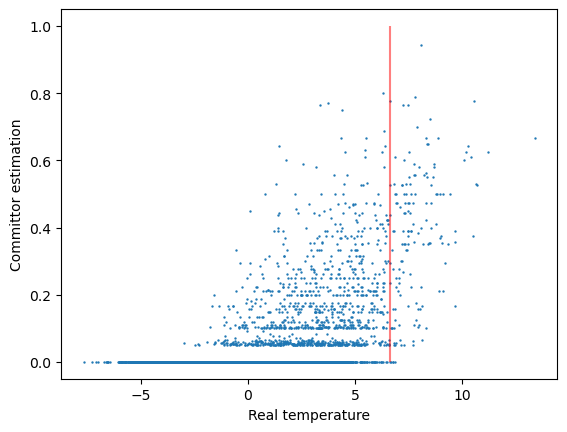

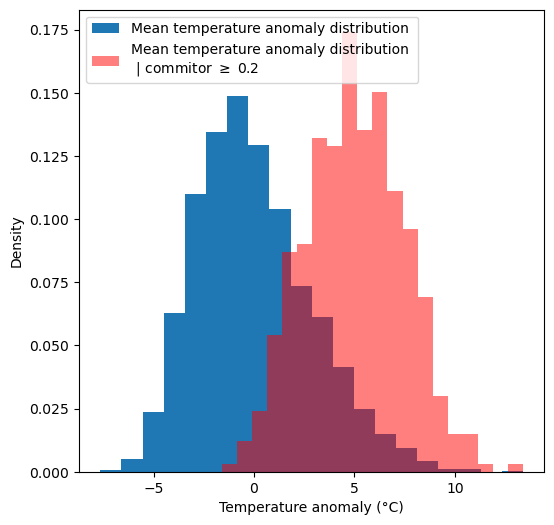

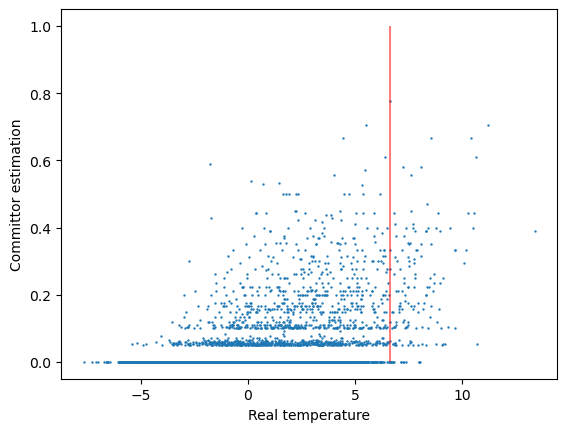

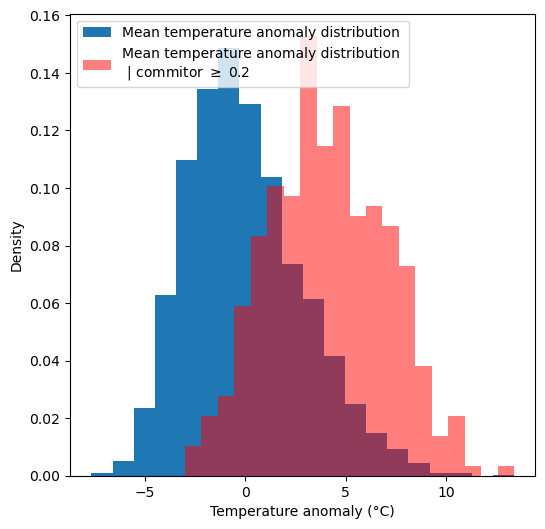

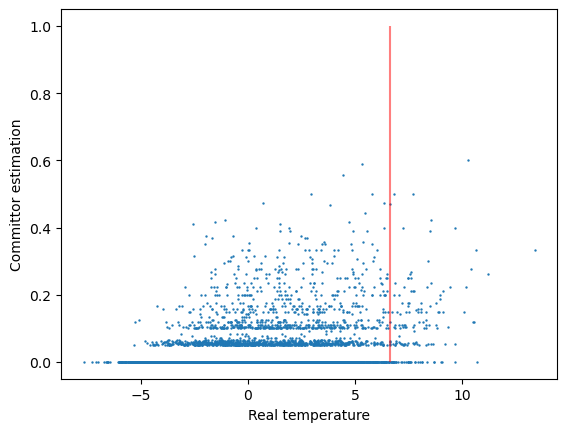

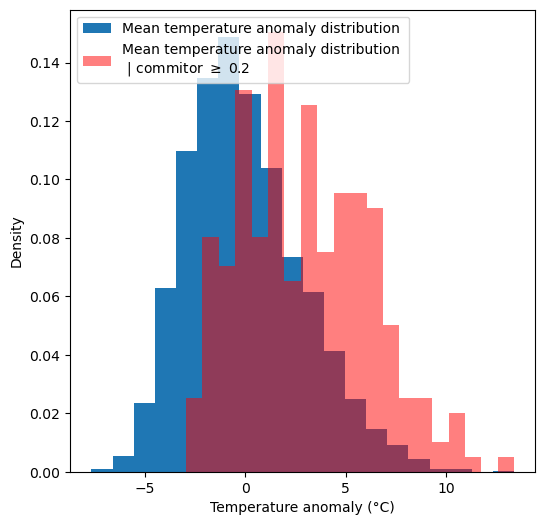

In [50]:
analogs_hist(analogs_weighted_with_tas_era5_to_all_ranked,1)
analogs_hist(analogs_weighted_with_tas_era5_to_all_ranked,2)
analogs_hist(analogs_weighted_with_tas_era5_to_all_ranked,3)

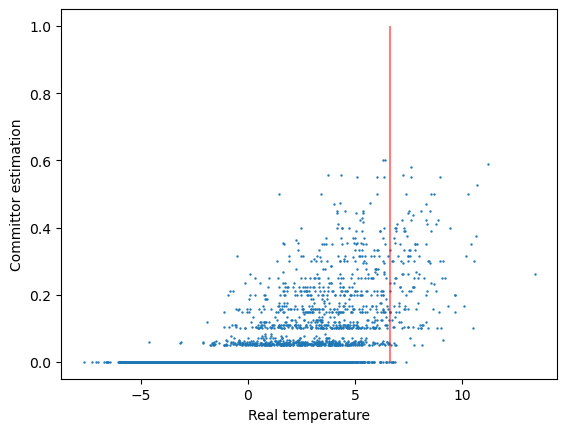

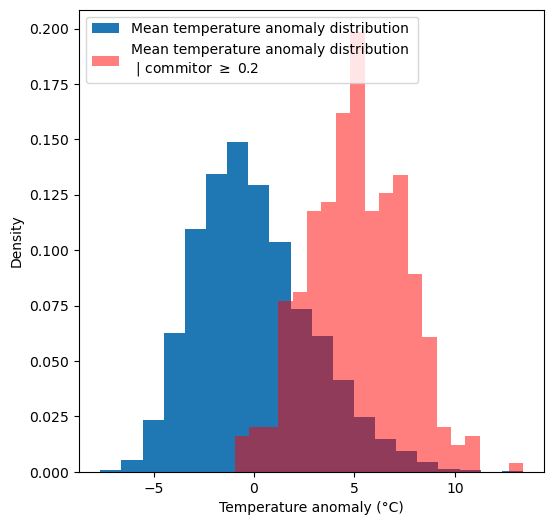

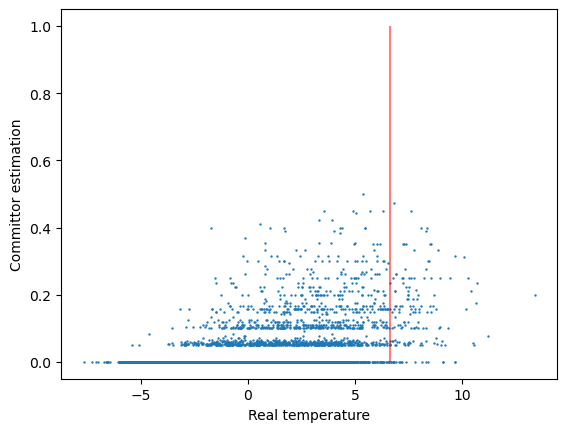

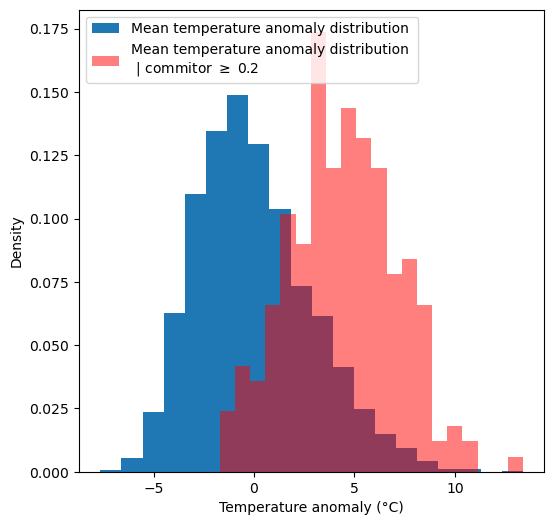

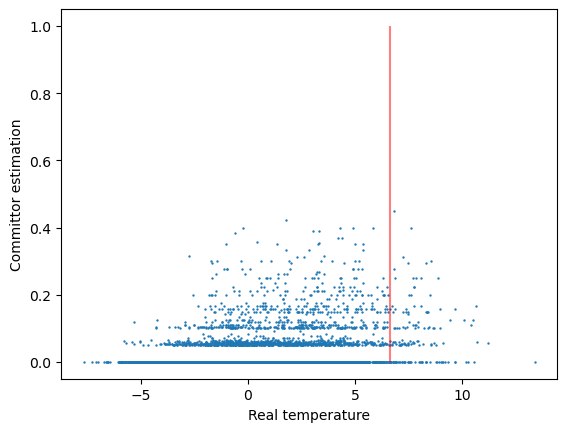

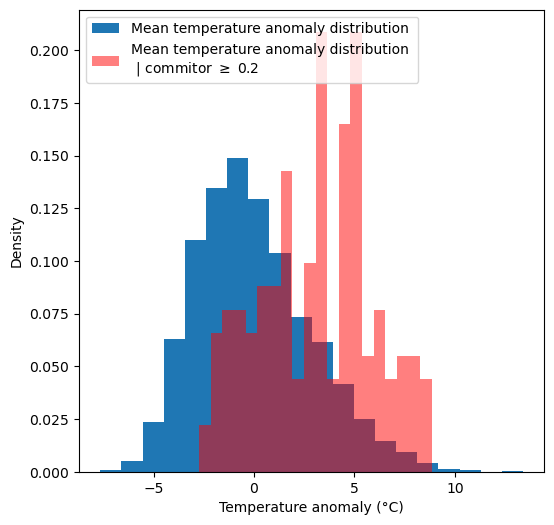

In [51]:
analogs_hist(analogs_weighted_with_tas_era5_to_era5_ranked,1)
analogs_hist(analogs_weighted_with_tas_era5_to_era5_ranked,2)
analogs_hist(analogs_weighted_with_tas_era5_to_era5_ranked,3)

## Résultats ML

### Plot of UNET at lag0 (ERA5)

In [52]:
validation_lag0_era5 = xr.open_dataset(
    "/homedata/pchevali/model_preds/psl_zg_pr10_to_tas_era5_lag0.nc"
)

In [53]:
lsmask=fix_lat_lon(xr.open_dataset("IMERG_land_sea_mask.nc"))
lsmask=lsmask.interp(lat=validation_lag0_era5.lat,lon=validation_lag0_era5.lon)

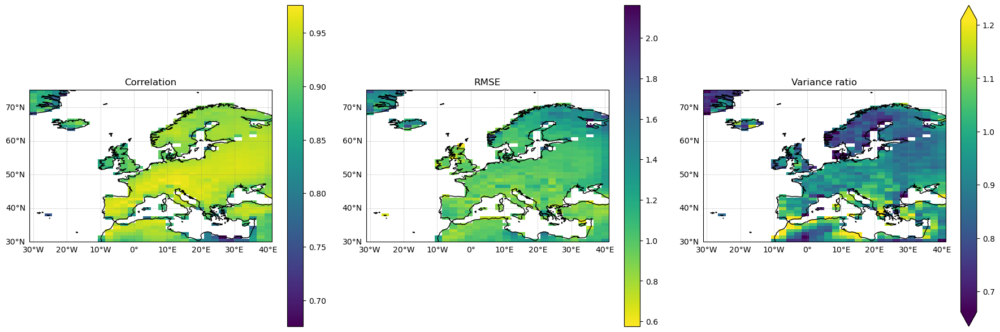

In [54]:
fig, axes = plt.subplots(
    nrows=1, ncols=3, figsize=(18, 6), subplot_kw={"projection": ccrs.PlateCarree()}
)

# Correlation
corr = xs.spearman_r(validation_lag0_era5.out_true, validation_lag0_era5.out_predict, dim="time")
ax = axes[0]
corr.where(lsmask['landseamask']<85).plot(ax=ax, transform=ccrs.PlateCarree(), cmap="viridis")
ax.coastlines()
gl = ax.gridlines(
    draw_labels=True,
    crs=ccrs.PlateCarree(),
    linewidth=0.5,
    color="gray",
    alpha=0.5,
    linestyle="--",
)
gl.top_labels = False
gl.right_labels = False
ax.set_title("Correlation")

# RMSE
rmse = xs.rmse(validation_lag0_era5.out_true, validation_lag0_era5.out_predict, dim="time")
ax = axes[1]
rmse.where(lsmask['landseamask']<85).plot(ax=ax, transform=ccrs.PlateCarree(), cmap="viridis_r")
ax.coastlines()
gl = ax.gridlines(
    draw_labels=True,
    crs=ccrs.PlateCarree(),
    linewidth=0.5,
    color="gray",
    alpha=0.5,
    linestyle="--",
)
gl.top_labels = False
gl.right_labels = False
ax.set_title("RMSE")

# Variance ratio
v_true = validation_lag0_era5.out_true.std(dim="time")
v_observed = validation_lag0_era5.out_predict.std(dim="time")
v_ratio = (v_observed / v_true) ** 2
ax = axes[2]
v_ratio.where(lsmask['landseamask']<85).plot(ax=ax, transform=ccrs.PlateCarree(), cmap="viridis",robust=True)
ax.coastlines()
gl = ax.gridlines(
    draw_labels=True,
    crs=ccrs.PlateCarree(),
    linewidth=0.5,
    color="gray",
    alpha=0.5,
    linestyle="--",
)
gl.top_labels = False
gl.right_labels = False
ax.set_title("Variance ratio")

plt.tight_layout()
plt.show()

In [55]:
paris_temp_era = validation_lag0_era5.out_true.sel(lat=48.88, lon=2.33, method="nearest")
paris_temp_pred_era = validation_lag0_era5.out_predict.sel(lat=48.88, lon=2.33, method="nearest")

### Plot of UNET at lag0 (ERA5 transferred)

In [56]:
validation_lag0_transfer = xr.open_dataset(
    "/homedata/pchevali/model_preds/psl_zg_pr10_to_tas_transfer_era5_lag0.nc"
)

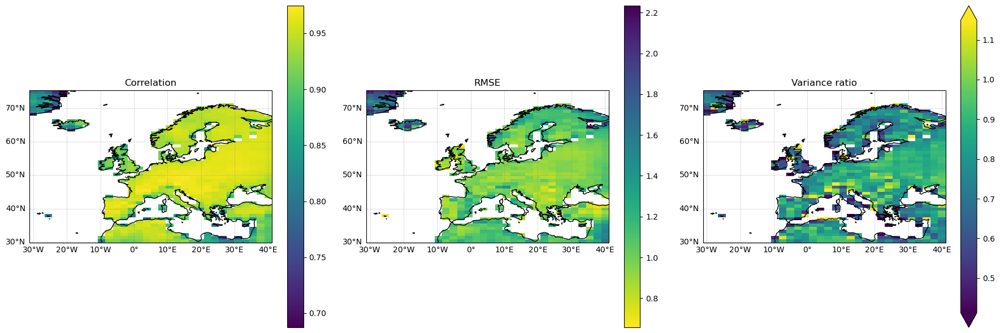

In [57]:
fig, axes = plt.subplots(
    nrows=1, ncols=3, figsize=(18, 6), subplot_kw={"projection": ccrs.PlateCarree()}
)

# Correlation
corr = xs.spearman_r(validation_lag0_transfer.out_true, validation_lag0_transfer.out_predict, dim="time")
ax = axes[0]
corr.where(lsmask['landseamask']<85).plot(ax=ax, transform=ccrs.PlateCarree(), cmap="viridis")
ax.coastlines()
gl = ax.gridlines(
    draw_labels=True,
    crs=ccrs.PlateCarree(),
    linewidth=0.5,
    color="gray",
    alpha=0.5,
    linestyle="--",
)
gl.top_labels = False
gl.right_labels = False
ax.set_title("Correlation")

# RMSE
rmse = xs.rmse(validation_lag0_transfer.out_true, validation_lag0_transfer.out_predict, dim="time")
ax = axes[1]
rmse.where(lsmask['landseamask']<85).plot(ax=ax, transform=ccrs.PlateCarree(), cmap="viridis_r")
ax.coastlines()
gl = ax.gridlines(
    draw_labels=True,
    crs=ccrs.PlateCarree(),
    linewidth=0.5,
    color="gray",
    alpha=0.5,
    linestyle="--",
)
gl.top_labels = False
gl.right_labels = False
ax.set_title("RMSE")

# Variance ratio
v_true = validation_lag0_transfer.out_true.std(dim="time")
v_observed = validation_lag0_transfer.out_predict.std(dim="time")
v_ratio = (v_observed / v_true) ** 2
ax = axes[2]
v_ratio.where(lsmask['landseamask']<85).plot(ax=ax, transform=ccrs.PlateCarree(), cmap="viridis",robust=True)
ax.coastlines()
gl = ax.gridlines(
    draw_labels=True,
    crs=ccrs.PlateCarree(),
    linewidth=0.5,
    color="gray",
    alpha=0.5,
    linestyle="--",
)
gl.top_labels = False
gl.right_labels = False
ax.set_title("Variance ratio")

plt.tight_layout()
plt.show()

In [58]:
paris_temp_transfer = validation_lag0_transfer.out_true.sel(lat=48.88, lon=2.33, method="nearest")
paris_temp_pred_transfer = validation_lag0_transfer.out_predict.sel(lat=48.88, lon=2.33, method="nearest")

### Plot of UNET at lag0 (ERA5 in model trained on IPSL)

In [59]:
validation_lag0_ipsl_era = xr.open_dataset(
    "/homedata/pchevali/model_preds/psl_zg_pr10_to_tas_hard_transfer_lag0.nc"
)

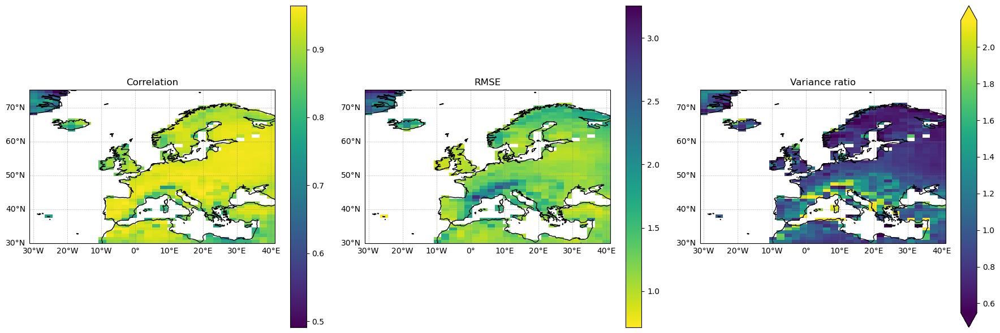

In [60]:
fig, axes = plt.subplots(
    nrows=1, ncols=3, figsize=(18, 6), subplot_kw={"projection": ccrs.PlateCarree()}
)

# Correlation
corr = xs.spearman_r(validation_lag0_ipsl_era.out_true, validation_lag0_ipsl_era.out_predict, dim="time")
ax = axes[0]
corr.where(lsmask['landseamask']<85).plot(ax=ax, transform=ccrs.PlateCarree(), cmap="viridis")
ax.coastlines()
gl = ax.gridlines(
    draw_labels=True,
    crs=ccrs.PlateCarree(),
    linewidth=0.5,
    color="gray",
    alpha=0.5,
    linestyle="--",
)
gl.top_labels = False
gl.right_labels = False
ax.set_title("Correlation")

# RMSE
rmse = xs.rmse(validation_lag0_ipsl_era.out_true, validation_lag0_ipsl_era.out_predict, dim="time")
ax = axes[1]
rmse.where(lsmask['landseamask']<85).plot(ax=ax, transform=ccrs.PlateCarree(), cmap="viridis_r")
ax.coastlines()
gl = ax.gridlines(
    draw_labels=True,
    crs=ccrs.PlateCarree(),
    linewidth=0.5,
    color="gray",
    alpha=0.5,
    linestyle="--",
)
gl.top_labels = False
gl.right_labels = False
ax.set_title("RMSE")

# Variance ratio
v_true = validation_lag0_ipsl_era.out_true.std(dim="time")
v_observed = validation_lag0_ipsl_era.out_predict.std(dim="time")
v_ratio = (v_observed / v_true) ** 2
ax = axes[2]
v_ratio.where(lsmask['landseamask']<85).plot(ax=ax, transform=ccrs.PlateCarree(), cmap="viridis",robust=True)
ax.coastlines()
gl = ax.gridlines(
    draw_labels=True,
    crs=ccrs.PlateCarree(),
    linewidth=0.5,
    color="gray",
    alpha=0.5,
    linestyle="--",
)
gl.top_labels = False
gl.right_labels = False
ax.set_title("Variance ratio")

plt.tight_layout()
plt.show()

In [61]:
paris_temp_hard = validation_lag0_ipsl_era.out_true.sel(lat=48.88, lon=2.33, method="nearest")
paris_temp_pred_hard = validation_lag0_ipsl_era.out_predict.sel(lat=48.88, lon=2.33, method="nearest")

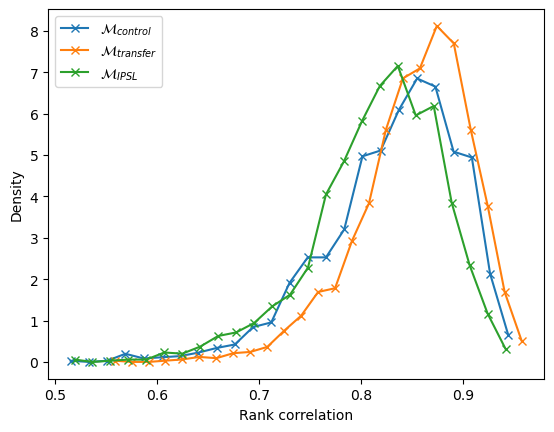

In [62]:
data_control = xs.spearman_r(validation_lag0_era5.out_true, validation_lag0_era5.out_predict, dim=["lat","lon"]).values
data_transfer = xs.spearman_r(validation_lag0_transfer.out_true, validation_lag0_transfer.out_predict, dim=["lat","lon"]).values
data_ipsl = xs.spearman_r(validation_lag0_ipsl_era.out_true, validation_lag0_ipsl_era.out_predict, dim=["lat","lon"]).values

hist_control=np.histogram(data_control, density=True,bins=25)
hist_transfer=np.histogram(data_transfer, density=True,bins=25)
hist_ipsl=np.histogram(data_ipsl, density=True,bins=25)


bin_centers_control = 0.5 * (hist_control[1][:-1] + hist_control[1][1:])
bin_centers_transfer = 0.5 * (hist_transfer[1][:-1] + hist_transfer[1][1:])
bin_centers_ipsl = 0.5 * (hist_ipsl[1][:-1] + hist_ipsl[1][1:])


plt.plot(bin_centers_control, hist_control[0], '-x', label=r"$\mathcal{M}_{control}$")
plt.plot(bin_centers_transfer, hist_transfer[0], '-x', label=r"$\mathcal{M}_{transfer}$")
plt.plot(bin_centers_ipsl, hist_ipsl[0], '-x', label=r"$\mathcal{M}_{IPSL}$")

plt.xlabel("Rank correlation")
plt.ylabel("Density")
plt.legend()
plt.show()

In [63]:
np.quantile(data_control,0.5)

0.8410663229110815

In [64]:
np.quantile(data_transfer,0.5)

0.8589179513901398

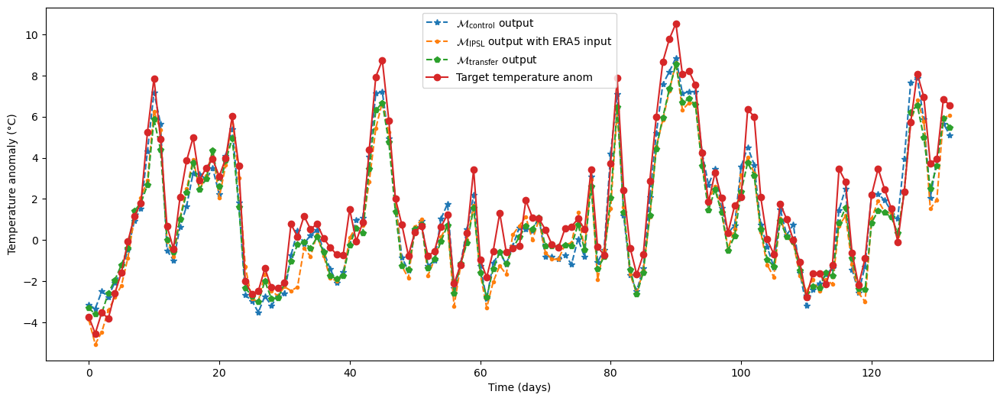

In [65]:
i = np.random.choice(
    validation_lag0_era5.time.values[
        (decode_index(validation_lag0_era5.time, "day") == 11)
        & (decode_index(validation_lag0_era5.time, "month") == 5)
    ]
)
i = validation_lag0_era5.get_index("time").get_loc(i)
plt.figure(figsize=(16, 6))
plt.plot(
    paris_temp_pred_era.isel(time=slice(i, i+133)), 
    "--*", 
    label=r"$\mathcal{M}_{\text{control}}$ output"
)
plt.plot(
    paris_temp_pred_hard.isel(time=slice(i, i + 133)),
    "--.",
    label=r"$\mathcal{M}_{\text{IPSL}}$ output with ERA5 input"
)
plt.plot(
    paris_temp_pred_transfer.isel(time=slice(i, i + 133)),
    "--p",
    label=r"$\mathcal{M}_{\text{transfer}}$ output"
)
plt.plot(paris_temp_era.isel(time=slice(i, i + 133)), "-o",label="Target temperature anom")
plt.legend()
plt.xlabel("Time (days)")
plt.ylabel("Temperature anomaly (°C)")
plt.show()

In [66]:
print(r"Rank correlation of ts for M_control : ", xs.spearman_r(paris_temp_pred_era,paris_temp_era).item())
print(r"Rank correlation of ts for M_IPSL : ", xs.spearman_r(paris_temp_pred_hard,paris_temp_era).item())
print(r"Rank correlation of ts for M_transfer : ", xs.spearman_r(paris_temp_pred_transfer,paris_temp_era).item())

Rank correlation of ts for M_control :  0.9324171952323891
Rank correlation of ts for M_IPSL :  0.9322180412589495
Rank correlation of ts for M_transfer :  0.9504897367226365


In [67]:
print(r"Correlation of ts for M_control : ", xs.pearson_r(paris_temp_pred_era,paris_temp_era).item())
print(r"Correlation of ts for M_IPSL : ", xs.pearson_r(paris_temp_pred_hard,paris_temp_era).item())
print(r"Correlation of ts for M_transfer : ", xs.pearson_r(paris_temp_pred_transfer,paris_temp_era).item())

Correlation of ts for M_control :  0.9391623678999688
Correlation of ts for M_IPSL :  0.9367963515951871
Correlation of ts for M_transfer :  0.9554416763311216


In [68]:
print(r"CCC of ts for M_control : ", CCC(paris_temp_pred_era,paris_temp_era).item())
print(r"CCC of ts for M_IPSL : ", CCC(paris_temp_pred_hard,paris_temp_era).item())
print(r"CCC of ts for M_transfer : ", CCC(paris_temp_pred_transfer,paris_temp_era).item())

CCC of ts for M_control :  0.9354561785011094
CCC of ts for M_IPSL :  0.8992085624637124
CCC of ts for M_transfer :  0.9301760626217129


In [69]:
print(r"RMSE of ts for M_control : ", xs.rmse(paris_temp_pred_era,paris_temp_era).item())
print(r"RMSE of ts for M_IPSL : ", xs.rmse(paris_temp_pred_hard,paris_temp_era).item())
print(r"RMSE of ts for M_transfer : ", xs.rmse(paris_temp_pred_transfer,paris_temp_era).item())

RMSE of ts for M_control :  1.0002881223816036
RMSE of ts for M_IPSL :  1.2289698750788465
RMSE of ts for M_transfer :  0.9933747427810667


In [70]:
extremes_era5.mean()-paris_temp_pred_era.sel(time=extremes_era5.index).values.mean()

2.238405789900572

### Plot of UNET at lag0 (IPSL)

In [71]:
validation_ipsl_lag0 = xr.open_dataset(
    "/homedata/pchevali/model_preds/psl_zg_pr10_to_tas_ipsl_lag0.nc"
)

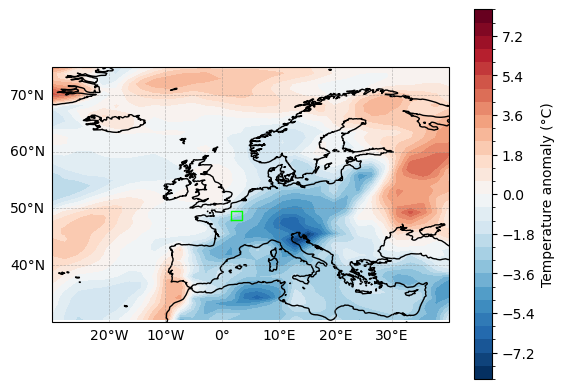

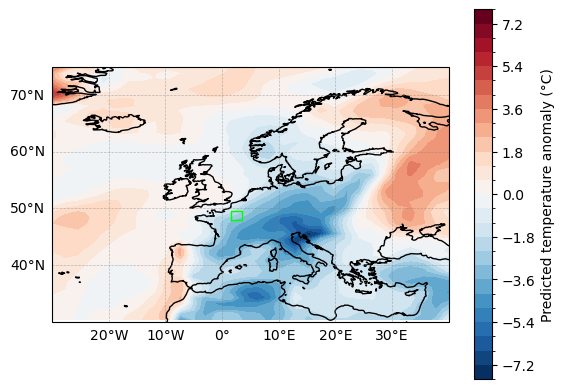

In [72]:
d = np.random.choice(validation_ipsl_lag0.time.values)
plot_one_date(
    field1=validation_ipsl_lag0.out_true,
    cmap_legend="Temperature anomaly (°C)",
    lat_min=30,
    lat_max=75,
    lon_min=-30,
    lon_max=40,
    time=d,
)
plot_one_date(
    field1=validation_ipsl_lag0.out_predict,
    cmap_legend="Predicted temperature anomaly (°C)",
    lat_min=30,
    lat_max=75,
    lon_min=-30,
    lon_max=40,
    time=d,
)

In [73]:
lsmask=fix_lat_lon(xr.open_dataset("IMERG_land_sea_mask.nc"))
lsmask=lsmask.interp(lat=validation_ipsl_lag0.lat,lon=validation_ipsl_lag0.lon)

In [74]:
np.save("/homedata/pchevali/ERA5/lsmask.npy",(lsmask['landseamask']<85).values)

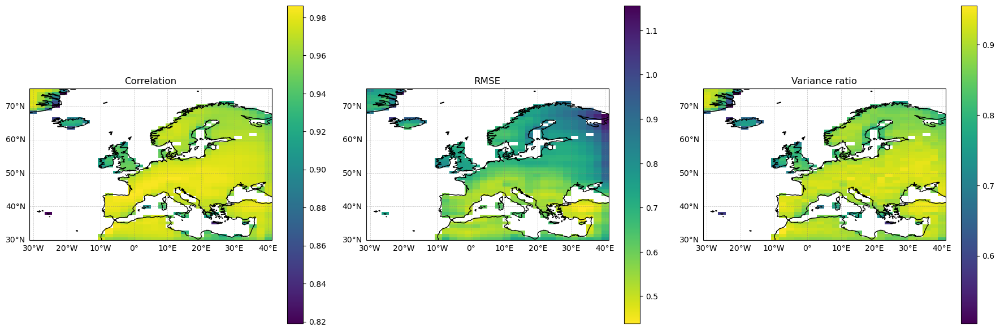

In [75]:
fig, axes = plt.subplots(
    nrows=1, ncols=3, figsize=(18, 6), subplot_kw={"projection": ccrs.PlateCarree()}
)

# Correlation
corr = xs.spearman_r(validation_ipsl_lag0.out_true, validation_ipsl_lag0.out_predict, dim="time")
ax = axes[0]
corr.where(lsmask['landseamask']<85).plot(ax=ax, transform=ccrs.PlateCarree(), cmap="viridis")
ax.coastlines()
gl = ax.gridlines(
    draw_labels=True,
    crs=ccrs.PlateCarree(),
    linewidth=0.5,
    color="gray",
    alpha=0.5,
    linestyle="--",
)
gl.top_labels = False
gl.right_labels = False
ax.set_title("Correlation")

# RMSE
rmse = xs.rmse(validation_ipsl_lag0.out_true, validation_ipsl_lag0.out_predict, dim="time")
ax = axes[1]
rmse.where(lsmask['landseamask']<85).plot(ax=ax, transform=ccrs.PlateCarree(), cmap="viridis_r")
ax.coastlines()
gl = ax.gridlines(
    draw_labels=True,
    crs=ccrs.PlateCarree(),
    linewidth=0.5,
    color="gray",
    alpha=0.5,
    linestyle="--",
)
gl.top_labels = False
gl.right_labels = False
ax.set_title("RMSE")

# Variance ratio
v_true = validation_ipsl_lag0.out_true.std(dim="time")
v_observed = validation_ipsl_lag0.out_predict.std(dim="time")
v_ratio = (v_observed / v_true) ** 2
ax = axes[2]
v_ratio.where(lsmask['landseamask']<85).plot(ax=ax, transform=ccrs.PlateCarree(), cmap="viridis")
ax.coastlines()
gl = ax.gridlines(
    draw_labels=True,
    crs=ccrs.PlateCarree(),
    linewidth=0.5,
    color="gray",
    alpha=0.5,
    linestyle="--",
)
gl.top_labels = False
gl.right_labels = False
ax.set_title("Variance ratio")

plt.tight_layout()
plt.show()

In [76]:
print("Mean correlation : ", corr.mean().item())
print("Mean RMSE : ", rmse.mean().item())
print("Mean variance ratio : ", v_ratio.mean().item())

Mean correlation :  0.879711908758228
Mean RMSE :  0.7959901690483093
Mean variance ratio :  0.698952853679657


In [77]:
paris_temp0 = validation_ipsl_lag0.out_true.sel(lat=48.88, lon=2.33, method="nearest")
paris_temp_pred0 = validation_ipsl_lag0.out_predict.sel(lat=48.88, lon=2.33, method="nearest")

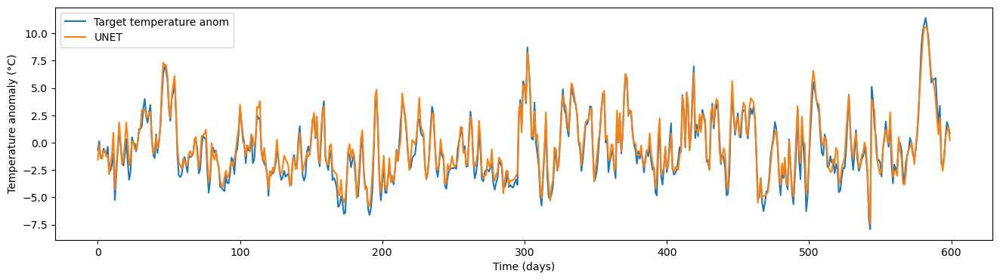

In [78]:
i = np.random.randint(60000)
plt.figure(figsize=(16,4))
plt.plot(paris_temp0.values[i : i + 600], label="Target temperature anom")
plt.plot(paris_temp_pred0.values[i : i + 600], label="UNET")
plt.legend()
plt.xlabel("Time (days)")
plt.ylabel("Temperature anomaly (°C)")
plt.show()

In [79]:
CCC(paris_temp0,paris_temp_pred0)

0.9720809115661893

In [80]:
extremes_val=get_indep_maxima(paris_temp0,20,15)

In [81]:
extremes_val.values

array([12.4610939 , 11.87108994, 11.55245876, 11.41392994, 11.17271423,
       10.90131283, 10.83080673, 10.78553581, 10.61279488, 10.50237846,
       10.39202976, 10.36316681, 10.17741776, 10.17262268, 10.14988708,
       10.11628723, 10.0675211 , 10.00520611,  9.98656559,  9.92353439])

In [82]:
paris_temp_pred0.sel(time=extremes_val.index).values

array([11.00705  , 10.981585 , 10.7300625, 10.547021 , 11.451605 ,
        9.86711  ,  9.084949 , 10.523252 , 11.298327 ,  9.980794 ,
        9.368779 , 10.043577 ,  9.026719 , 10.862633 ,  9.641659 ,
        8.567331 ,  9.156396 ,  9.990032 , 10.44941  ,  8.499566 ],
      dtype=float32)

### Plot of UNET at lag1 (IPSL)

In [83]:
validation_ipsl_lag1 = xr.open_dataset(
    "/homedata/pchevali/model_preds/psl_zg_pr10_tas_to_tas_ipsl_lag1.nc"
)
validation_ipsl_lag1["time"]=add_days_from_index(validation_ipsl_lag1.time.values,1)

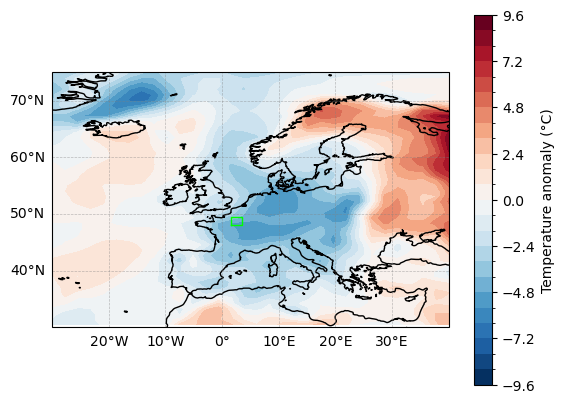

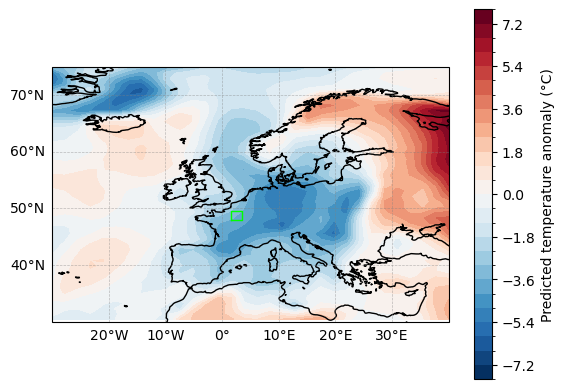

In [84]:
d = np.random.choice(validation_ipsl_lag1.time.values)
plot_one_date(
    field1=validation_ipsl_lag1.out_true,
    cmap_legend="Temperature anomaly (°C)",
    lat_min=30,
    lat_max=75,
    lon_min=-30,
    lon_max=40,
    time=d,
)
plot_one_date(
    field1=validation_ipsl_lag1.out_predict,
    cmap_legend="Predicted temperature anomaly (°C)",
    lat_min=30,
    lat_max=75,
    lon_min=-30,
    lon_max=40,
    time=d,
)

In [85]:
lsmask=fix_lat_lon(xr.open_dataset("IMERG_land_sea_mask.nc"))
lsmask=lsmask.interp(lat=validation_ipsl_lag1.lat,lon=validation_ipsl_lag1.lon)

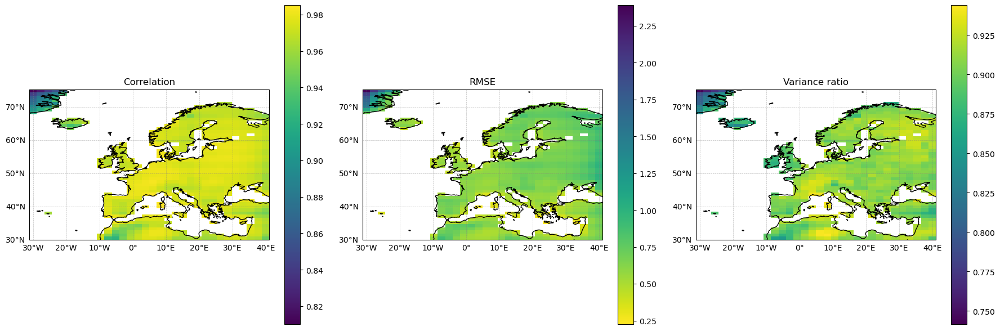

In [86]:
fig, axes = plt.subplots(
    nrows=1, ncols=3, figsize=(18, 6), subplot_kw={"projection": ccrs.PlateCarree()}
)

# Correlation
corr = xs.spearman_r(validation_ipsl_lag1.out_true, validation_ipsl_lag1.out_predict, dim="time")
ax = axes[0]
corr.where(lsmask['landseamask']<85).plot(ax=ax, transform=ccrs.PlateCarree(), cmap="viridis")
ax.coastlines()
gl = ax.gridlines(
    draw_labels=True,
    crs=ccrs.PlateCarree(),
    linewidth=0.5,
    color="gray",
    alpha=0.5,
    linestyle="--",
)
gl.top_labels = False
gl.right_labels = False
ax.set_title("Correlation")

# RMSE
rmse = xs.rmse(validation_ipsl_lag1.out_true, validation_ipsl_lag1.out_predict, dim="time")
ax = axes[1]
rmse.where(lsmask['landseamask']<85).plot(ax=ax, transform=ccrs.PlateCarree(), cmap="viridis_r")
ax.coastlines()
gl = ax.gridlines(
    draw_labels=True,
    crs=ccrs.PlateCarree(),
    linewidth=0.5,
    color="gray",
    alpha=0.5,
    linestyle="--",
)
gl.top_labels = False
gl.right_labels = False
ax.set_title("RMSE")

# Variance ratio
v_true = validation_ipsl_lag1.out_true.std(dim="time")
v_observed = validation_ipsl_lag1.out_predict.std(dim="time")
v_ratio = (v_observed / v_true) ** 2
ax = axes[2]
v_ratio.where(lsmask['landseamask']<85).plot(ax=ax, transform=ccrs.PlateCarree(), cmap="viridis")
ax.coastlines()
gl = ax.gridlines(
    draw_labels=True,
    crs=ccrs.PlateCarree(),
    linewidth=0.5,
    color="gray",
    alpha=0.5,
    linestyle="--",
)
gl.top_labels = False
gl.right_labels = False
ax.set_title("Variance ratio")

plt.tight_layout()
plt.show()

In [87]:
print("Mean correlation : ", corr.mean().item())
print("Mean RMSE : ", rmse.mean().item())
print("Mean variance ratio : ", v_ratio.mean().item())

Mean correlation :  0.9680033418661328
Mean RMSE :  0.5066983103752136
Mean variance ratio :  0.8938193917274475


In [88]:
paris_temp1 = validation_ipsl_lag1.out_true.sel(lat=48.88, lon=2.33, method="nearest")
paris_temp_pred1 = validation_ipsl_lag1.out_predict.sel(lat=48.88, lon=2.33, method="nearest")

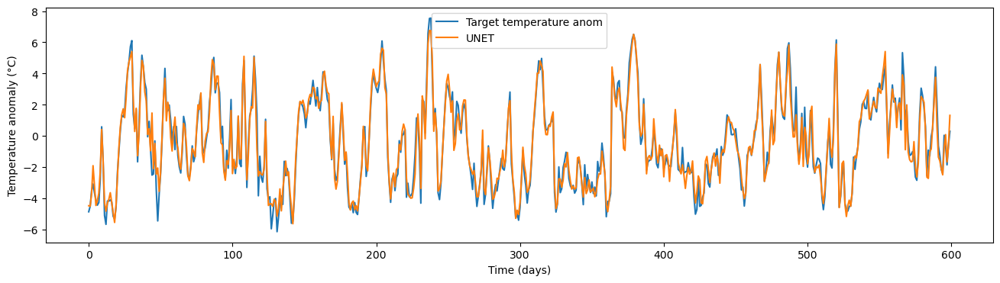

In [89]:
i = np.random.randint(60000)
plt.figure(figsize=(16,4))
plt.plot(paris_temp1.values[i : i + 600], label="Target temperature anom")
plt.plot(paris_temp_pred1.values[i : i + 600], label="UNET")
plt.legend()
plt.xlabel("Time (days)")
plt.ylabel("Temperature anomaly (°C)")
plt.show()

In [90]:
CCC(paris_temp1,paris_temp_pred1)

0.9766784029710169

In [91]:
extremes_val=get_indep_maxima(paris_temp1,20,15)

In [92]:
extremes_val.values

array([12.4610939 , 11.87108994, 11.55245876, 11.41392994, 11.17271423,
       10.90131283, 10.83080673, 10.78553581, 10.61279488, 10.50237846,
       10.39202976, 10.36316681, 10.17741776, 10.17262268, 10.14988708,
       10.11628723, 10.0675211 , 10.00520611,  9.98656559,  9.92353439])

In [93]:
paris_temp_pred1.sel(time=extremes_val.index).values

array([11.012233 , 10.0916815, 11.128145 , 10.65961  , 10.32251  ,
        9.0602255,  8.368381 ,  9.305888 ,  9.604889 ,  9.89654  ,
        9.695334 ,  9.902625 ,  8.641328 ,  9.981738 ,  8.667909 ,
        8.210381 ,  8.529573 ,  9.62266  ,  8.378481 ,  9.327434 ],
      dtype=float32)

### Plot of UNET at lag2 (IPSL)

In [94]:
validation_ipsl_lag2 = xr.open_dataset(
    "/homedata/pchevali/model_preds/psl_zg_pr10_tas_to_tas_ipsl_lag2.nc"
)
validation_ipsl_lag2["time"]=add_days_from_index(validation_ipsl_lag2.time.values,2)

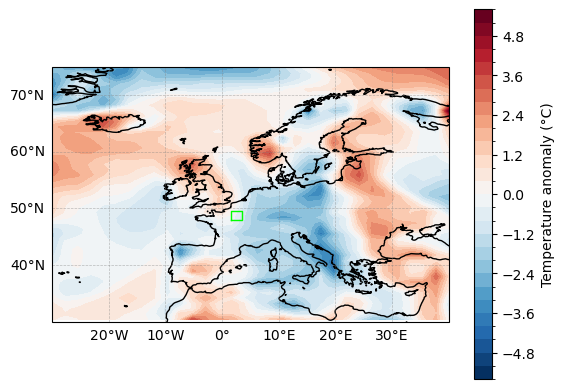

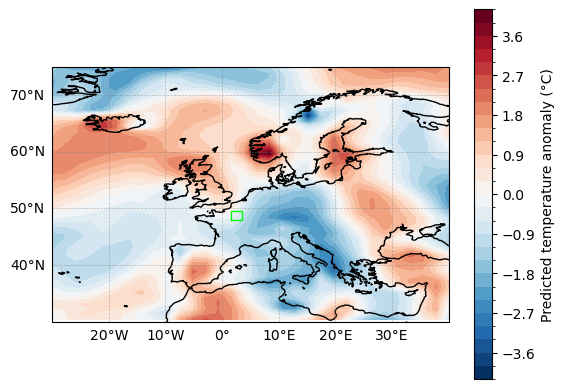

In [95]:
d = np.random.choice(validation_ipsl_lag2.time.values)
plot_one_date(
    field1=validation_ipsl_lag2.out_true,
    cmap_legend="Temperature anomaly (°C)",
    lat_min=30,
    lat_max=75,
    lon_min=-30,
    lon_max=40,
    time=d,
)
plot_one_date(
    field1=validation_ipsl_lag2.out_predict,
    cmap_legend="Predicted temperature anomaly (°C)",
    lat_min=30,
    lat_max=75,
    lon_min=-30,
    lon_max=40,
    time=d,
)

In [96]:
lsmask=fix_lat_lon(xr.open_dataset("IMERG_land_sea_mask.nc"))
lsmask=lsmask.interp(lat=validation_ipsl_lag2.lat,lon=validation_ipsl_lag2.lon)

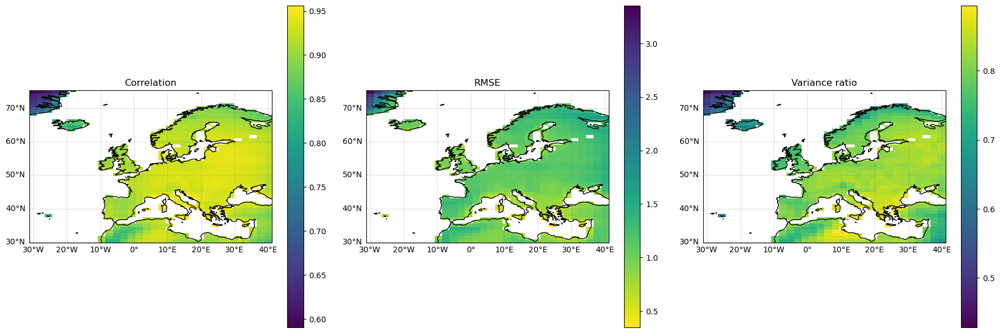

In [97]:
fig, axes = plt.subplots(
    nrows=1, ncols=3, figsize=(18, 6), subplot_kw={"projection": ccrs.PlateCarree()}
)

# Correlation
corr = xs.spearman_r(validation_ipsl_lag2.out_true, validation_ipsl_lag2.out_predict, dim="time")
ax = axes[0]
corr.where(lsmask['landseamask']<85).plot(ax=ax, transform=ccrs.PlateCarree(), cmap="viridis")
ax.coastlines()
gl = ax.gridlines(
    draw_labels=True,
    crs=ccrs.PlateCarree(),
    linewidth=0.5,
    color="gray",
    alpha=0.5,
    linestyle="--",
)
gl.top_labels = False
gl.right_labels = False
ax.set_title("Correlation")

# RMSE
rmse = xs.rmse(validation_ipsl_lag2.out_true, validation_ipsl_lag2.out_predict, dim="time")
ax = axes[1]
rmse.where(lsmask['landseamask']<85).plot(ax=ax, transform=ccrs.PlateCarree(), cmap="viridis_r")
ax.coastlines()
gl = ax.gridlines(
    draw_labels=True,
    crs=ccrs.PlateCarree(),
    linewidth=0.5,
    color="gray",
    alpha=0.5,
    linestyle="--",
)
gl.top_labels = False
gl.right_labels = False
ax.set_title("RMSE")

# Variance ratio
v_true = validation_ipsl_lag2.out_true.std(dim="time")
v_observed = validation_ipsl_lag2.out_predict.std(dim="time")
v_ratio = (v_observed / v_true) ** 2
ax = axes[2]
v_ratio.where(lsmask['landseamask']<85).plot(ax=ax, transform=ccrs.PlateCarree(), cmap="viridis")
ax.coastlines()
gl = ax.gridlines(
    draw_labels=True,
    crs=ccrs.PlateCarree(),
    linewidth=0.5,
    color="gray",
    alpha=0.5,
    linestyle="--",
)
gl.top_labels = False
gl.right_labels = False
ax.set_title("Variance ratio")

plt.tight_layout()
plt.show()

In [98]:
print("Mean correlation : ", corr.mean().item())
print("Mean RMSE : ", rmse.mean().item())
print("Mean variance ratio : ", v_ratio.mean().item())

Mean correlation :  0.9004688502111785
Mean RMSE :  0.874518096446991
Mean variance ratio :  0.7620376944541931


In [99]:
paris_temp2 = validation_ipsl_lag2.out_true.sel(lat=48.88, lon=2.33, method="nearest")
paris_temp_pred2 = validation_ipsl_lag2.out_predict.sel(lat=48.88, lon=2.33, method="nearest")

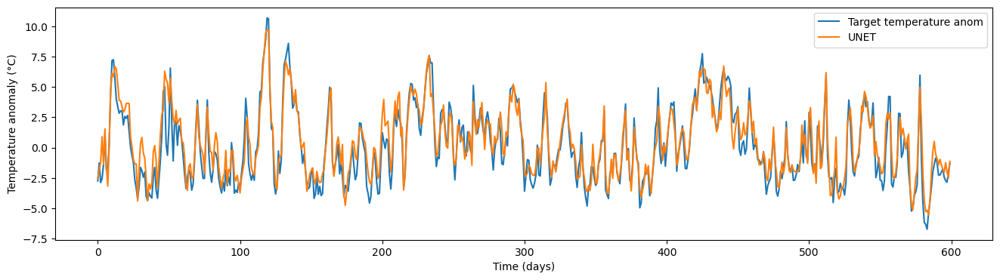

In [100]:
i = np.random.randint(60000)
plt.figure(figsize=(16,4))
plt.plot(paris_temp2.values[i : i + 600], label="Target temperature anom")
plt.plot(paris_temp_pred2.values[i : i + 600], label="UNET")
plt.legend()
plt.xlabel("Time (days)")
plt.ylabel("Temperature anomaly (°C)")
plt.show()

In [101]:
CCC(paris_temp2,paris_temp_pred2)

0.9158921738541812

In [102]:
extremes_val=get_indep_maxima(paris_temp2,20,15)

In [103]:
extremes_val.values

array([12.4610939 , 11.87108994, 11.55245876, 11.41392994, 11.17271423,
       10.90131283, 10.83080673, 10.78553581, 10.61279488, 10.50237846,
       10.39202976, 10.36316681, 10.17741776, 10.17262268, 10.14988708,
       10.11628723, 10.0675211 , 10.00520611,  9.98656559,  9.92353439])

In [104]:
paris_temp_pred2.sel(time=extremes_val.index).values

array([ 8.896847 ,  7.2196527, 10.203876 ,  9.864332 ,  7.8610024,
        8.562236 ,  6.0977535, 10.012899 ,  7.9548855,  9.192937 ,
        8.23673  ,  6.1367555,  5.190665 ,  8.309268 ,  5.1589026,
        5.0803604,  5.2725773, 10.383377 ,  8.608023 ,  7.06235  ],
      dtype=float32)

### Plot of UNET at lag3 (IPSL)

In [105]:
validation_ipsl_lag3 = xr.open_dataset(
    "/homedata/pchevali/model_preds/psl_zg_pr10_tas_to_tas_ipsl_lag3.nc"
)
validation_ipsl_lag3["time"]=add_days_from_index(validation_ipsl_lag3.time.values,3)

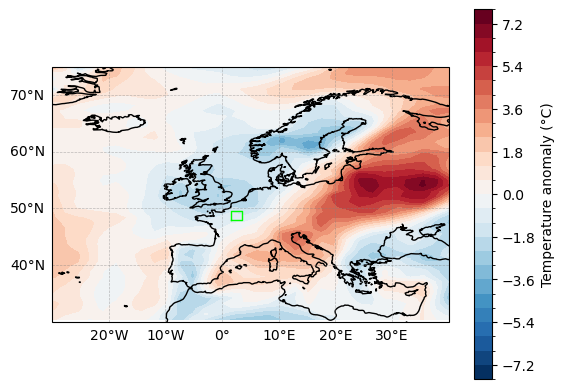

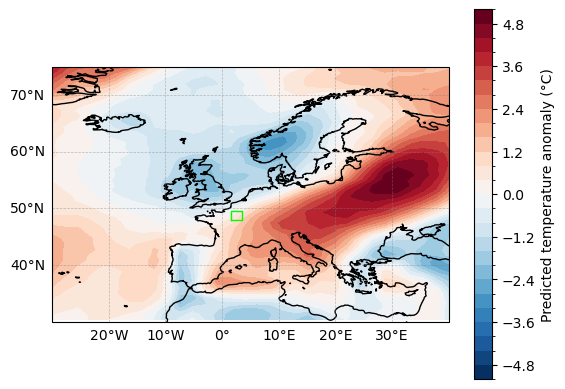

In [106]:
d = np.random.choice(validation_ipsl_lag3.time.values)
plot_one_date(
    field1=validation_ipsl_lag3.out_true,
    cmap_legend="Temperature anomaly (°C)",
    lat_min=30,
    lat_max=75,
    lon_min=-30,
    lon_max=40,
    time=d,
)
plot_one_date(
    field1=validation_ipsl_lag3.out_predict,
    cmap_legend="Predicted temperature anomaly (°C)",
    lat_min=30,
    lat_max=75,
    lon_min=-30,
    lon_max=40,
    time=d,
)

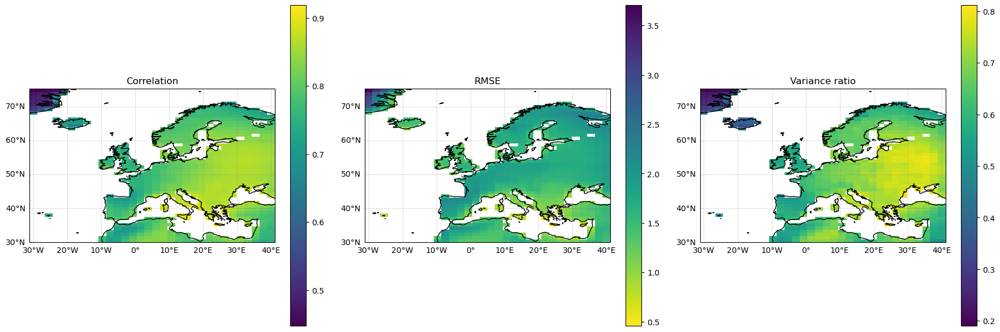

In [107]:
fig, axes = plt.subplots(
    nrows=1, ncols=3, figsize=(18, 6), subplot_kw={"projection": ccrs.PlateCarree()}
)

# Correlation
corr = xs.spearman_r(validation_ipsl_lag3.out_true, validation_ipsl_lag3.out_predict, dim="time")
ax = axes[0]
corr.where(lsmask['landseamask']<85).plot(ax=ax, transform=ccrs.PlateCarree(), cmap="viridis")
ax.coastlines()
gl = ax.gridlines(
    draw_labels=True,
    crs=ccrs.PlateCarree(),
    linewidth=0.5,
    color="gray",
    alpha=0.5,
    linestyle="--",
)
gl.top_labels = False
gl.right_labels = False
ax.set_title("Correlation")

# RMSE
rmse = xs.rmse(validation_ipsl_lag3.out_true, validation_ipsl_lag3.out_predict, dim="time")
ax = axes[1]
rmse.where(lsmask['landseamask']<85).plot(ax=ax, transform=ccrs.PlateCarree(), cmap="viridis_r")
ax.coastlines()
gl = ax.gridlines(
    draw_labels=True,
    crs=ccrs.PlateCarree(),
    linewidth=0.5,
    color="gray",
    alpha=0.5,
    linestyle="--",
)
gl.top_labels = False
gl.right_labels = False
ax.set_title("RMSE")

# Variance ratio
v_true = validation_ipsl_lag3.out_true.std(dim="time")
v_observed = validation_ipsl_lag3.out_predict.std(dim="time")
v_ratio = (v_observed / v_true) ** 2
ax = axes[2]
v_ratio.where(lsmask['landseamask']<85).plot(ax=ax, transform=ccrs.PlateCarree(), cmap="viridis")
ax.coastlines()
gl = ax.gridlines(
    draw_labels=True,
    crs=ccrs.PlateCarree(),
    linewidth=0.5,
    color="gray",
    alpha=0.5,
    linestyle="--",
)
gl.top_labels = False
gl.right_labels = False
ax.set_title("Variance ratio")

plt.tight_layout()
plt.show()

In [108]:
print("Mean correlation : ", corr.mean().item())
print("Mean RMSE : ", rmse.mean().item())
print("Mean variance ratio : ", v_ratio.mean().item())

Mean correlation :  0.7992038190040244
Mean RMSE :  1.2440890073776245
Mean variance ratio :  0.6043698191642761


In [109]:
paris_temp3 = validation_ipsl_lag3.out_true.sel(lat=48.88, lon=2.33, method="nearest")
paris_temp_pred3 = validation_ipsl_lag3.out_predict.sel(lat=48.88, lon=2.33, method="nearest")

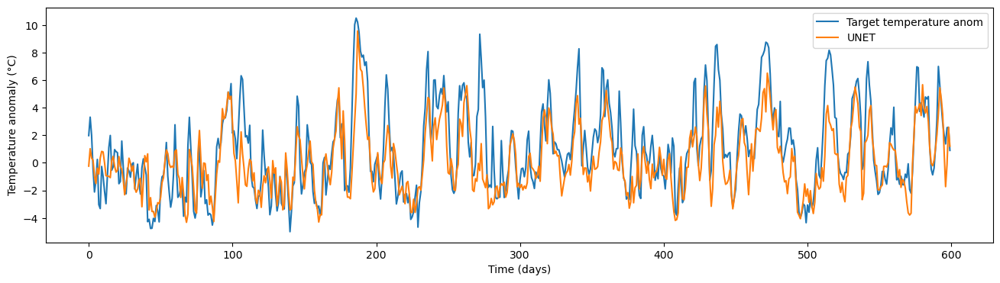

In [110]:
i = np.random.randint(60000)
plt.figure(figsize=(16,4))
plt.plot(paris_temp3.values[i : i + 600], label="Target temperature anom")
plt.plot(paris_temp_pred3.values[i : i + 600], label="UNET")
plt.legend()
plt.xlabel("Time (days)")
plt.ylabel("Temperature anomaly (°C)")
plt.show()

In [111]:
CCC(paris_temp3,paris_temp_pred3)

0.7382478999099471

In [112]:
extremes_val=get_indep_maxima(paris_temp3,20,15)

In [113]:
extremes_val.values

array([12.4610939 , 11.87108994, 11.55245876, 11.41392994, 11.17271423,
       10.90131283, 10.83080673, 10.78553581, 10.61279488, 10.50237846,
       10.39202976, 10.36316681, 10.17741776, 10.17262268, 10.14988708,
       10.11628723, 10.0675211 , 10.00520611,  9.98656559,  9.92353439])

In [114]:
paris_temp_pred3.sel(time=extremes_val.index).values

array([6.258371 , 1.4478592, 8.335953 , 9.145337 , 5.395435 , 1.7863455,
       4.878618 , 5.5759554, 6.4473147, 5.0089946, 1.7767447, 2.2791812,
       2.3230886, 4.0931153, 4.647899 , 2.2246847, 4.457401 , 4.341189 ,
       7.8868217, 5.4468775], dtype=float32)

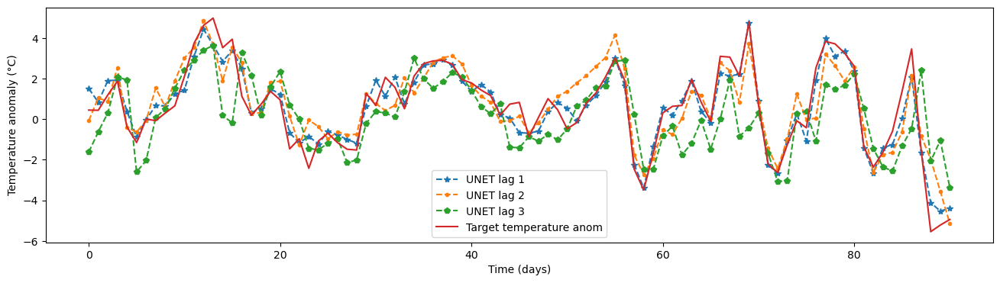

In [115]:
i=np.random.choice(validation_ipsl_lag0.time.values[(decode_index(validation_ipsl_lag0.time,"day")==10)&(decode_index(validation_ipsl_lag0.time,"month")==6)])
i0 = validation_ipsl_lag0.get_index("time").get_loc(i)
i1 = validation_ipsl_lag1.get_index("time").get_loc(i)
i2 = validation_ipsl_lag2.get_index("time").get_loc(i)
i3 = validation_ipsl_lag3.get_index("time").get_loc(i)

plt.figure(figsize=(16,4))
plt.plot(paris_temp_pred1.isel(time=slice(i1,i1+91)),"--*", label="UNET lag 1")
plt.plot(paris_temp_pred2.isel(time=slice(i2,i2+91)),"--.", label="UNET lag 2")
plt.plot(paris_temp_pred3.isel(time=slice(i3,i3+91)),"--p", label="UNET lag 3")
plt.plot(paris_temp0.isel(time=slice(i0,i0+91)), label="Target temperature anom")
plt.legend()
plt.xlabel("Time (days)")
plt.ylabel("Temperature anomaly (°C)")
plt.show()

# dump

## Comparaison entre analogues et unet + eval transfer learning (estimation d'une carte de committor)

Functions to make it using analogs

In [116]:
def compute_committor_map_analogs(anal, times, tau):
    mask = np.isin(decode_index(tas_anom_era5.time.values, "month"), [6, 7, 8])
    committors_array = []
    committors_true_array = []
    for t in times:
        t_moins_tau = add_days_from_index(t, -tau)
        t_moins_tau_tildes = anal.analog_date.sel(time=t_moins_tau).values
        temp_mask = np.isin(
            decode_index(t_moins_tau_tildes, "month"), [5, 6, 7, 8]
        )  # making sure going forward in time won't give us dates we don't have (happens when the analogue is in september)
        t_0_tildes = add_days_from_index(t_moins_tau_tildes[temp_mask], tau)
        committors = (tas_anom_merged.tas.sel(time=t_0_tildes) > q).mean("time").values
        committors_true = (tas_anom_merged.tas.sel(time=t) > q).values * 1
        committors_array.append(committors * 1)
        committors_true_array.append(committors_true)

    committors_array = np.array(committors_array)
    committors_true_array = np.array(committors_true_array)

    lat = tas_anom_merged.lat.values
    lon = tas_anom_merged.lon.values

    da = xr.Dataset(
        {
            "committor_est": (["time", "lat", "lon"], committors_array),
            "committor_true": (["time", "lat", "lon"], committors_true_array),
        },
        coords={
            "time": times,
            "lat": lat,
            "lon": lon,
        },
    )

    return da

In [117]:
committor_analogs_notl_tau1=compute_committor_map_analogs(analogs_weighted_with_tas_era5_to_era5_ranked,extremes_era5.index,1)
committor_analogs_notl_tau2=compute_committor_map_analogs(analogs_weighted_with_tas_era5_to_era5_ranked,extremes_era5.index,2)
committor_analogs_notl_tau3=compute_committor_map_analogs(analogs_weighted_with_tas_era5_to_era5_ranked,extremes_era5.index,3)
committor_analogs_notl_tau4=compute_committor_map_analogs(analogs_weighted_with_tas_era5_to_era5_ranked,extremes_era5.index,4)
committor_analogs_notl_tau5=compute_committor_map_analogs(analogs_weighted_with_tas_era5_to_era5_ranked,extremes_era5.index,5)
committor_analogs_notl_tau6=compute_committor_map_analogs(analogs_weighted_with_tas_era5_to_era5_ranked,extremes_era5.index,6)
committor_analogs_notl_tau7=compute_committor_map_analogs(analogs_weighted_with_tas_era5_to_era5_ranked,extremes_era5.index,7)
committor_analogs_notl_tau8=compute_committor_map_analogs(analogs_weighted_with_tas_era5_to_era5_ranked,extremes_era5.index,8)
committor_analogs_notl_tau9=compute_committor_map_analogs(analogs_weighted_with_tas_era5_to_era5_ranked,extremes_era5.index,9)
committor_analogs_notl_tau10=compute_committor_map_analogs(analogs_weighted_with_tas_era5_to_era5_ranked,extremes_era5.index,10)

In [118]:
committor_analogs_tl_tau1=compute_committor_map_analogs(analogs_weighted_with_tas_era5_to_all_ranked,extremes_era5.index,1)
committor_analogs_tl_tau2=compute_committor_map_analogs(analogs_weighted_with_tas_era5_to_all_ranked,extremes_era5.index,2)
committor_analogs_tl_tau3=compute_committor_map_analogs(analogs_weighted_with_tas_era5_to_all_ranked,extremes_era5.index,3)
committor_analogs_tl_tau4=compute_committor_map_analogs(analogs_weighted_with_tas_era5_to_all_ranked,extremes_era5.index,4)
committor_analogs_tl_tau5=compute_committor_map_analogs(analogs_weighted_with_tas_era5_to_all_ranked,extremes_era5.index,5)
committor_analogs_tl_tau6=compute_committor_map_analogs(analogs_weighted_with_tas_era5_to_all_ranked,extremes_era5.index,6)
committor_analogs_tl_tau7=compute_committor_map_analogs(analogs_weighted_with_tas_era5_to_all_ranked,extremes_era5.index,7)
committor_analogs_tl_tau8=compute_committor_map_analogs(analogs_weighted_with_tas_era5_to_all_ranked,extremes_era5.index,8)
committor_analogs_tl_tau9=compute_committor_map_analogs(analogs_weighted_with_tas_era5_to_all_ranked,extremes_era5.index,9)
committor_analogs_tl_tau10=compute_committor_map_analogs(analogs_weighted_with_tas_era5_to_all_ranked,extremes_era5.index,10)

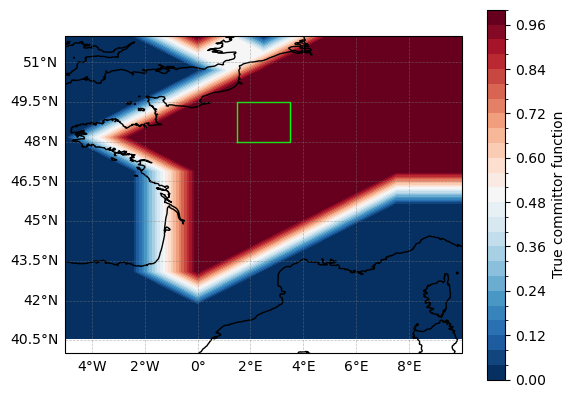

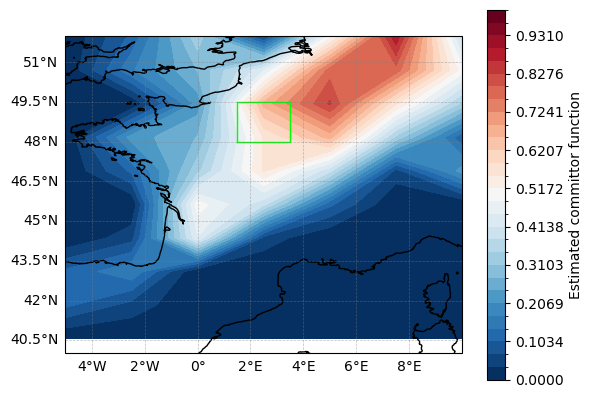

In [161]:
d=extremes_era5.index[0]
plot_one_date(
    field1=committor_analogs_notl_tau1.committor_true,
    cmap_legend="True committor function",
    lat_min=40,
    lat_max=52,
    lon_min=-5,
    lon_max=10,
    time=d,
)
plot_one_date(
    field1=committor_analogs_tl_tau1.committor_est,
    cmap_legend="Estimated committor function",
    lat_min=40,
    lat_max=52,
    lon_min=-5,
    lon_max=10,
    time=d,
    vmax=1
)

Importing the results of ML

In [120]:
extremes_ipsl_valid = get_indep_maxima(
    data=validation_ipsl_lag0.out_true, lat=48.88, lon=2.33, n=n, days_in_between=10
)

In [163]:
committor_unet_era5_tau1=xr.open_dataset("/homedata/pchevali/model_preds/psl_zg_pr10_tas_to_tas_era5_lag1_COMMITTOR.nc")
committor_unet_era5_tau1["time"]=add_days_from_index(committor_unet_era5_tau1.time.values,1)
committor_unet_era5_tau2=xr.open_dataset("/homedata/pchevali/model_preds/psl_zg_pr10_tas_to_tas_era5_lag2_COMMITTOR.nc")
committor_unet_era5_tau2["time"]=add_days_from_index(committor_unet_era5_tau2.time.values,2)
committor_unet_era5_tau3=xr.open_dataset("/homedata/pchevali/model_preds/psl_zg_pr10_tas_to_tas_era5_lag3_COMMITTOR.nc")
committor_unet_era5_tau3["time"]=add_days_from_index(committor_unet_era5_tau3.time.values,3)
committor_unet_era5_tau4=xr.open_dataset("/homedata/pchevali/model_preds/psl_zg_pr10_tas_to_tas_era5_lag4_COMMITTOR.nc")
committor_unet_era5_tau4["time"]=add_days_from_index(committor_unet_era5_tau4.time.values,4)
committor_unet_era5_tau5=xr.open_dataset("/homedata/pchevali/model_preds/psl_zg_pr10_tas_to_tas_era5_lag5_COMMITTOR.nc")
committor_unet_era5_tau5["time"]=add_days_from_index(committor_unet_era5_tau5.time.values,5)
committor_unet_era5_tau6=xr.open_dataset("/homedata/pchevali/model_preds/psl_zg_pr10_tas_to_tas_era5_lag6_COMMITTOR.nc")
committor_unet_era5_tau6["time"]=add_days_from_index(committor_unet_era5_tau6.time.values,6)
committor_unet_era5_tau7=xr.open_dataset("/homedata/pchevali/model_preds/psl_zg_pr10_tas_to_tas_era5_lag7_COMMITTOR.nc")
committor_unet_era5_tau7["time"]=add_days_from_index(committor_unet_era5_tau7.time.values,7)
committor_unet_era5_tau8=xr.open_dataset("/homedata/pchevali/model_preds/psl_zg_pr10_tas_to_tas_era5_lag8_COMMITTOR.nc")
committor_unet_era5_tau8["time"]=add_days_from_index(committor_unet_era5_tau8.time.values,8)
committor_unet_era5_tau9=xr.open_dataset("/homedata/pchevali/model_preds/psl_zg_pr10_tas_to_tas_era5_lag9_COMMITTOR.nc")
committor_unet_era5_tau9["time"]=add_days_from_index(committor_unet_era5_tau9.time.values,9)
committor_unet_era5_tau10=xr.open_dataset("/homedata/pchevali/model_preds/psl_zg_pr10_tas_to_tas_era5_lag10_COMMITTOR.nc")
committor_unet_era5_tau10["time"]=add_days_from_index(committor_unet_era5_tau10.time.values,10)

ground truth


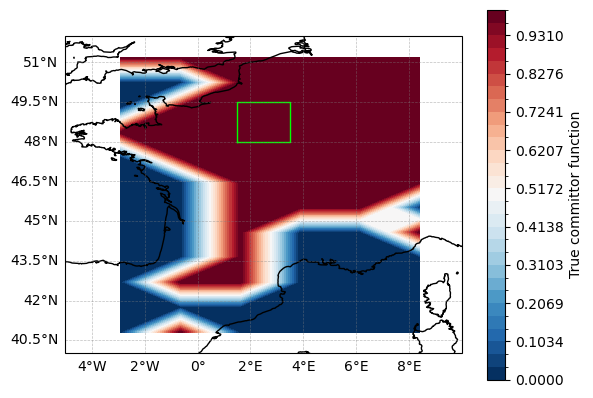

tau=1


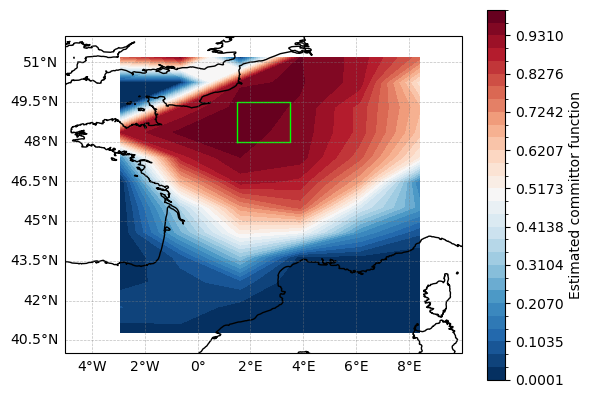

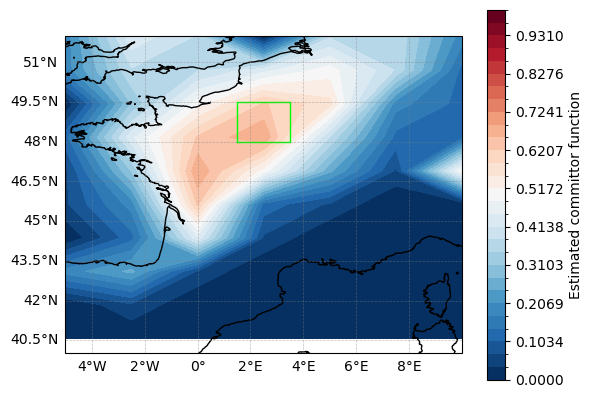

tau=2


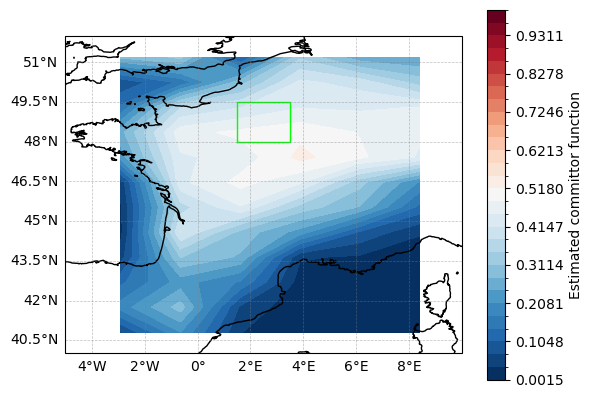

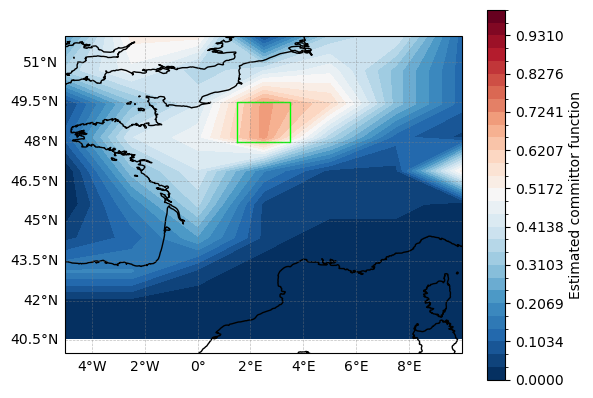

tau=3


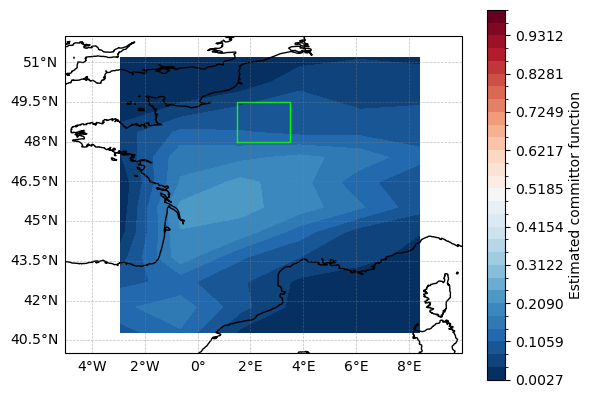

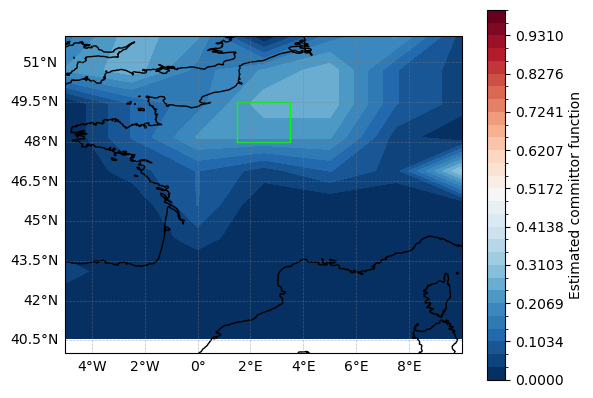

tau=4


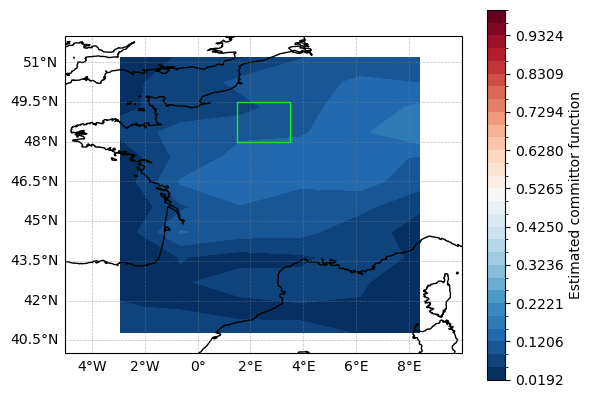

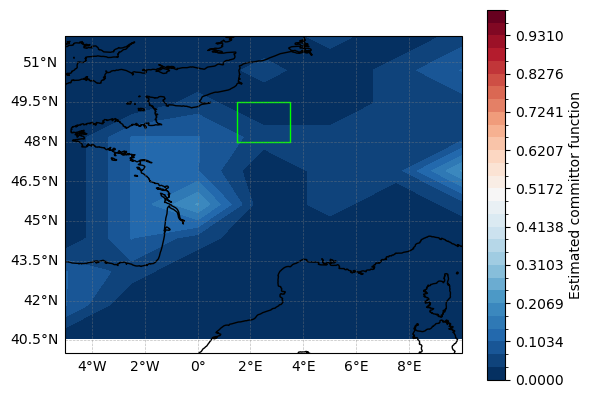

tau=5


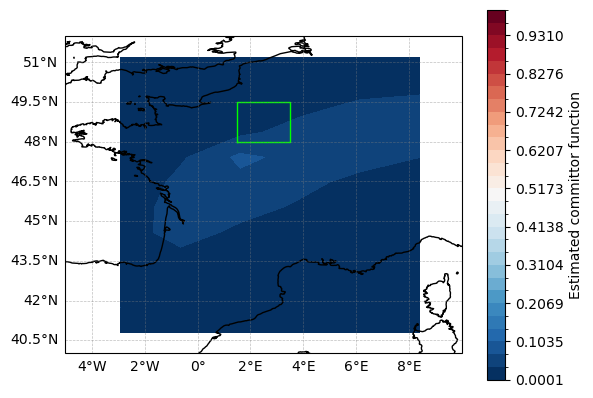

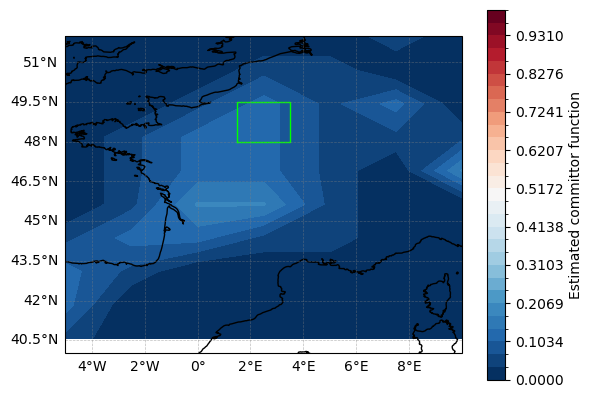

tau=6


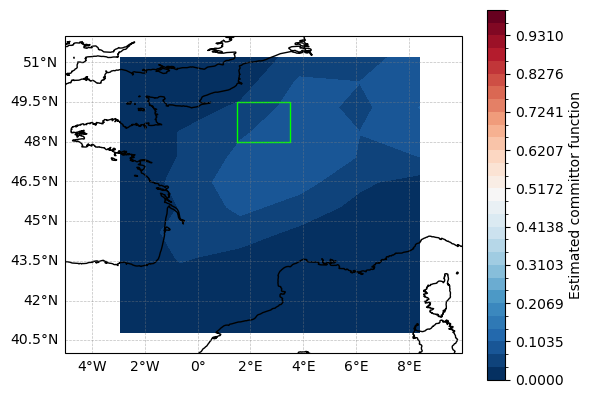

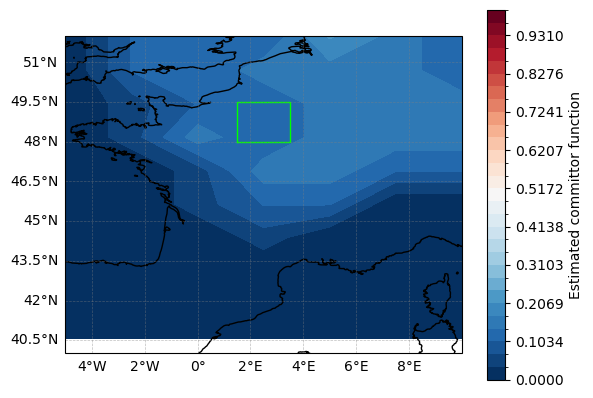

In [198]:
d=extremes_era5.index[1]
#d=np.random.choice(committor_unet_era5_tau4.time.values)
print("ground truth")
plot_one_date(
    field1=committor_unet_era5_tau1.out_true,
    cmap_legend="True committor function",
    lat_min=40,
    lat_max=52,
    lon_min=-5,
    lon_max=10,
    time=d,
    vmax=1
)
print("tau=1")
plot_one_date(
    field1=committor_unet_era5_tau1.out_predict,
    cmap_legend="Estimated committor function",
    lat_min=40,
    lat_max=52,
    lon_min=-5,
    lon_max=10,
    time=d,
    vmax=1
)
plot_one_date(
    field1=committor_analogs_tl_tau1.committor_est,
    cmap_legend="Estimated committor function",
    lat_min=40,
    lat_max=52,
    lon_min=-5,
    lon_max=10,
    time=d,
    vmax=1
)
print("tau=2")
plot_one_date(
    field1=committor_unet_era5_tau2.out_predict,
    cmap_legend="Estimated committor function",
    lat_min=40,
    lat_max=52,
    lon_min=-5,
    lon_max=10,
    time=d,
    vmax=1
)
plot_one_date(
    field1=committor_analogs_tl_tau2.committor_est,
    cmap_legend="Estimated committor function",
    lat_min=40,
    lat_max=52,
    lon_min=-5,
    lon_max=10,
    time=d,
    vmax=1
)
print("tau=3")
plot_one_date(
    field1=committor_unet_era5_tau3.out_predict,
    cmap_legend="Estimated committor function",
    lat_min=40,
    lat_max=52,
    lon_min=-5,
    lon_max=10,
    time=d,
    vmax=1
)
plot_one_date(
    field1=committor_analogs_tl_tau3.committor_est,
    cmap_legend="Estimated committor function",
    lat_min=40,
    lat_max=52,
    lon_min=-5,
    lon_max=10,
    time=d,
    vmax=1
)
print("tau=4")
plot_one_date(
    field1=committor_unet_era5_tau4.out_predict,
    cmap_legend="Estimated committor function",
    lat_min=40,
    lat_max=52,
    lon_min=-5,
    lon_max=10,
    time=d,
    vmax=1
)
plot_one_date(
    field1=committor_analogs_tl_tau4.committor_est,
    cmap_legend="Estimated committor function",
    lat_min=40,
    lat_max=52,
    lon_min=-5,
    lon_max=10,
    time=d,
    vmax=1
)
print("tau=5")
plot_one_date(
    field1=committor_unet_era5_tau5.out_predict,
    cmap_legend="Estimated committor function",
    lat_min=40,
    lat_max=52,
    lon_min=-5,
    lon_max=10,
    time=d,
    vmax=1
)
plot_one_date(
    field1=committor_analogs_tl_tau5.committor_est,
    cmap_legend="Estimated committor function",
    lat_min=40,
    lat_max=52,
    lon_min=-5,
    lon_max=10,
    time=d,
    vmax=1
)
print("tau=6")
plot_one_date(
    field1=committor_unet_era5_tau6.out_predict,
    cmap_legend="Estimated committor function",
    lat_min=40,
    lat_max=52,
    lon_min=-5,
    lon_max=10,
    time=d,
    vmax=1
)
plot_one_date(
    field1=committor_analogs_tl_tau6.committor_est,
    cmap_legend="Estimated committor function",
    lat_min=40,
    lat_max=52,
    lon_min=-5,
    lon_max=10,
    time=d,
    vmax=1
)

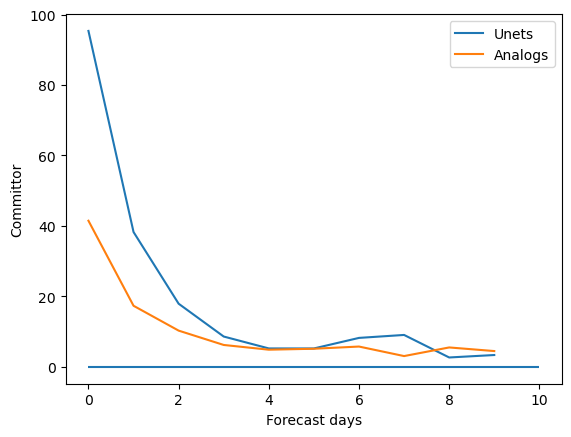

In [211]:
valid_era = [
    committor_unet_era5_tau1,
    committor_unet_era5_tau2,
    committor_unet_era5_tau3,
    committor_unet_era5_tau4,
    committor_unet_era5_tau5,
    committor_unet_era5_tau6,
    committor_unet_era5_tau7,
    committor_unet_era5_tau8,
    committor_unet_era5_tau9,
    committor_unet_era5_tau10,
]
committor_unet = [
    ds.out_predict.sel(lat=[48.169014, 49.43662],lon=2.33,method="nearest").mean("lat").sel(time=extremes_era5.index).mean().item()
    for ds in valid_era
]
committor_unet_global = [
    ds.out_predict.sel(lat=[48.169014, 49.43662],lon=2.33,method="nearest").mean("lat").mean().item()
    for ds in valid_era
]

anal = [
    committor_analogs_notl_tau1,
    committor_analogs_notl_tau2,
    committor_analogs_notl_tau3,
    committor_analogs_notl_tau4,
    committor_analogs_notl_tau5,
    committor_analogs_notl_tau6,
    committor_analogs_notl_tau7,
    committor_analogs_notl_tau8,
    committor_analogs_notl_tau9,
    committor_analogs_notl_tau10,
]

committor_anal = [
    ds.committor_est.sel(lat=[48.169014, 49.43662],lon=2.33,method="nearest").mean("lat").sel(time=extremes_era5.index).mean().item()
    for ds in anal
]

plt.plot(np.array(committor_unet)*100, label="Unets")
plt.plot(np.array(committor_anal)*100, label="Analogs")
plt.hlines(y=0,xmin=0,xmax=10)
plt.xlabel("Forecast days")
plt.ylabel("Committor")
plt.legend()
plt.show()

In [208]:
committor_analogs_tl_tau4.committor_est.sel(lat=[48.169014, 49.43662],lon=2.33,method="nearest").mean("lat")

<xarray.DataArray 'committor_est' (time: 5)>
array([0.17647059, 0.02631579, 0.02941176, 0.09375   , 0.15      ])
Coordinates:
  * time     (time) int64 20190725 20220719 20150701 20170621 20200809
    lon      float32 2.5